# Google Notebook specific Stuff

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install pytorch-lightning==1.3.3
# !pip install cloud-tpu-client==0.10 https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.8.1-cp37-cp37m-linux_x86_64.whl
!pip install scGeneFit
!pip install scanpy
!pip install anndata
# my version of smashpy that fixed imports, nothing else was changed
!pip install matplotlib>=3.3.2
!pip install shap>=0.37.0
!pip install xgboost>=1.3.3
!pip install imbalanced-learn>=0.7.0
!pip install numba>=0.51.2
!pip install harmonypy>=0.0.5
!git clone https://github.com/beelze-b/SmashFork.git
!git clone https://github.com/ahsv/RankCorr.git

fatal: destination path 'SmashFork' already exists and is not an empty directory.
fatal: destination path 'RankCorr' already exists and is not an empty directory.


In [ ]:
# Check GPU

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Mon Jun  7 03:22:14 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import sys
import os
# to import utils
sys.path.append(os.path.abspath('/content/gdrive/My Drive/Differentiable-Sparse-Subset-Selection/notebooks'))

# All the Imports

In [ ]:
%%time 
import itertools 
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.preprocessing import LabelEncoder


from RankCorr.picturedRocks import Rocks
import SmashFork.smashpy as smashpy


import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F

from utils import *


ModuleNotFoundError: ignored

# These should be parameters later on 

In [ ]:
z_size = 16
hidden_layer_size = 64

# really good results for vanilla VAE on synthetic data with EPOCHS set to 50, 
# but when running locally set to 10 for reasonable run times
batch_size = 64
batch_norm = True


global_t = 3.0

k_range = [10, 50, 100, 250]
k = 50
num_times = 5

gpus = 1
tpu_cores = None

In [ ]:
import multiprocessing

num_cores = multiprocessing.cpu_count()

# Here goes all the stuff that we change from dataset to dataset

In [ ]:
from os import path

In [ ]:
dataset_dir = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/CITE-seq/'
model_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/CITE-seq/models/'
viz_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/CITE-seq/visualizations/'

if not path.exists(model_save_path):
  os.mkdir(model_save_path)

if not path.exists(model_save_path + 'experiment_data_folds/'):
  os.mkdir(model_save_path + 'experiment_data_folds/')
  
if not path.exists(viz_save_path):
  os.mkdir(viz_save_path)

  

# Dataset Specific Processing

`

In [ ]:
citeseq_adata = sc.read_h5ad(dataset_dir + "CITEseq.h5ad")

In [ ]:
citeseq_adata.shape

(8617, 500)

In [ ]:
X = citeseq_adata.X.copy()

In [ ]:
np.apply_along_axis(np.mean, 0, X)

array([ 1.4166219e-08,  0.0000000e+00, -1.8371816e-08, -1.7707775e-08,
        0.0000000e+00,  0.0000000e+00, -1.0624665e-08,  7.0831097e-09,
       -1.0624665e-08,  3.5415548e-09, -7.3044570e-09, -7.0831097e-09,
        1.4166219e-08,  0.0000000e+00,  3.5415548e-09,  0.0000000e+00,
        2.1249329e-08, -7.0831097e-09,  7.0831097e-09,  1.7707774e-09,
        3.5415548e-09, -7.0831097e-09, -7.0831097e-09, -1.0624665e-08,
        7.0831097e-09,  2.6561662e-09, -7.0831097e-09, -7.0831097e-09,
        0.0000000e+00,  6.6404154e-10,  0.0000000e+00,  0.0000000e+00,
       -7.0831097e-09,  1.0624665e-08,  7.0831097e-09, -5.3123324e-09,
       -3.5415548e-09, -3.5415548e-09, -1.4166219e-08,  1.7707774e-09,
       -3.5415548e-09, -1.0624665e-08, -1.0624665e-08,  1.4166219e-08,
        1.0624665e-08,  1.7707775e-08, -2.1249329e-08,  4.8696380e-09,
        8.8538874e-09, -1.0624665e-08,  1.0624665e-08, -3.5415548e-09,
        3.5415548e-09, -4.4269435e-10,  0.0000000e+00,  1.0624665e-08,
      

In [ ]:
np.apply_along_axis(np.var, 0, X)

array([0.99988383, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988407, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988407,
       0.99988395, 0.99988407, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988383,
       0.99988395, 0.99988395, 0.99988407, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988407, 0.99988395,
       0.99988383, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988407, 0.99988407,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988395,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988407,
       0.99988395, 0.99988395, 0.99988395, 0.99988395, 0.99988

In [ ]:
citeseq_adata.obs['annotation'] = citeseq_adata.obs['names']
labels = citeseq_adata.obs['names'].values
encoder = LabelEncoder()
encoder.fit(labels)
y = encoder.transform(labels)

In [ ]:
input_size = X.shape[1]

In [ ]:
X.shape

(8617, 500)

# Set Up Models

## Train Smash Random Forest





In [ ]:
# needed for random forest Smash
!mkdir Figures

 * Initialising ...

Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

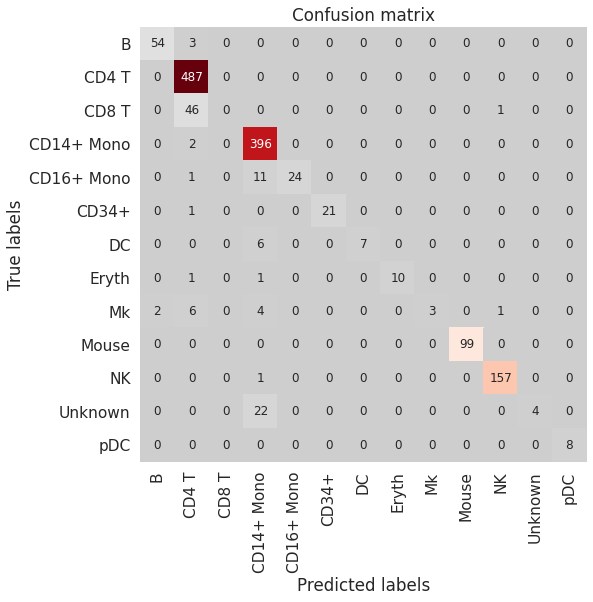

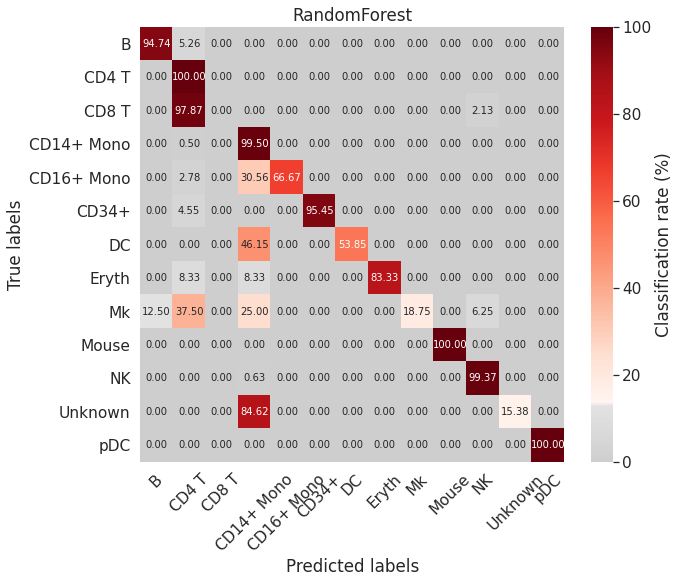

Accuracy: 0.920957215373459: Misclassification: 0.07904278462654102
              precision    recall  f1-score   support

           B       0.96      0.95      0.96        57
       CD4 T       0.89      1.00      0.94       487
       CD8 T       0.00      0.00      0.00        47
  CD14+ Mono       0.90      0.99      0.94       398
  CD16+ Mono       1.00      0.67      0.80        36
       CD34+       1.00      0.95      0.98        22
          DC       1.00      0.54      0.70        13
       Eryth       1.00      0.83      0.91        12
          Mk       1.00      0.19      0.32        16
       Mouse       1.00      1.00      1.00        99
          NK       0.99      0.99      0.99       158
     Unknown       1.00      0.15      0.27        26
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.71      0.75      1379
weighted avg       0.89      0.92      0.90      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



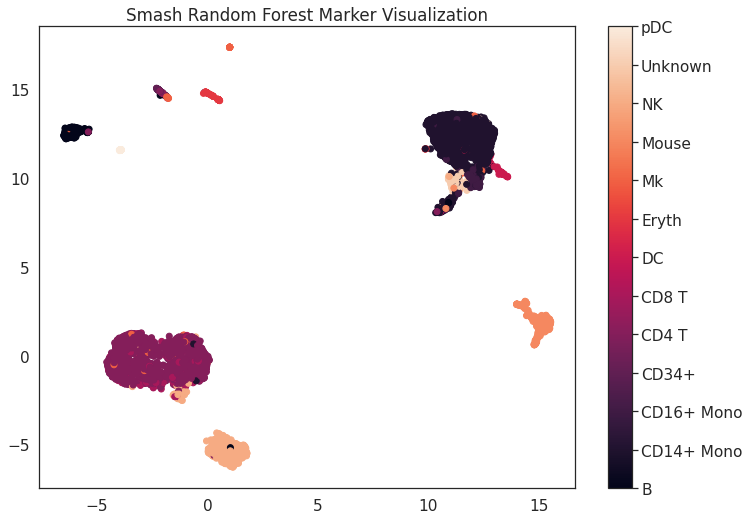

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

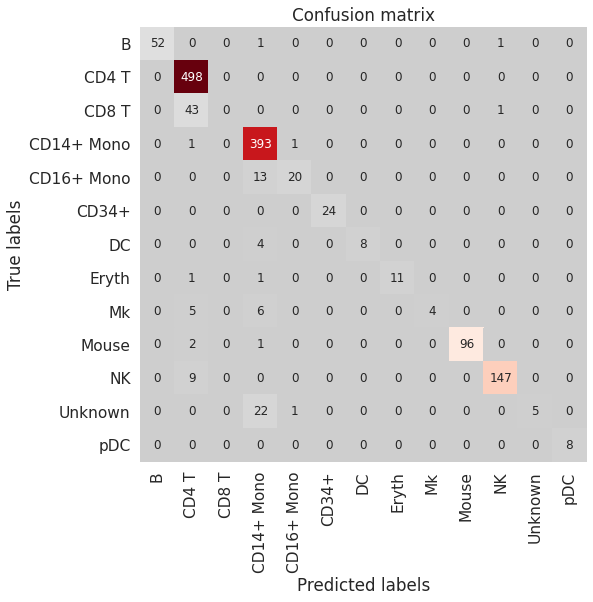

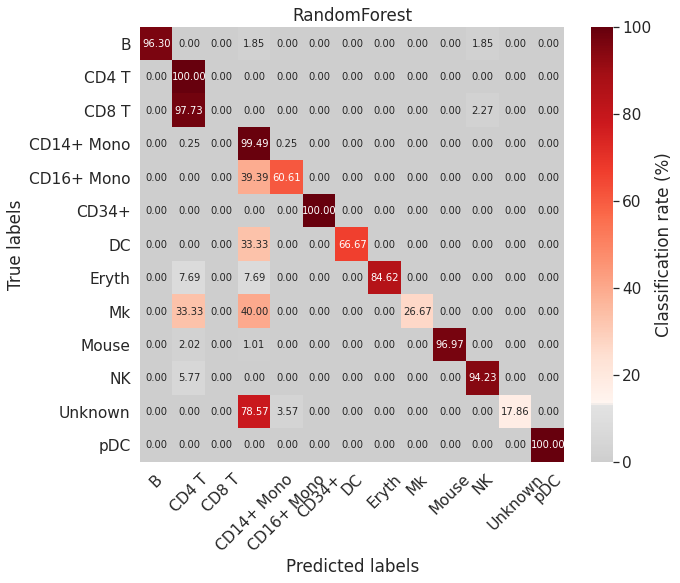

Accuracy: 0.9180565627266135: Misclassification: 0.08194343727338649
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        54
       CD4 T       0.89      1.00      0.94       498
       CD8 T       0.00      0.00      0.00        44
  CD14+ Mono       0.89      0.99      0.94       395
  CD16+ Mono       0.91      0.61      0.73        33
       CD34+       1.00      1.00      1.00        24
          DC       1.00      0.67      0.80        12
       Eryth       1.00      0.85      0.92        13
          Mk       1.00      0.27      0.42        15
       Mouse       1.00      0.97      0.98        99
          NK       0.99      0.94      0.96       156
     Unknown       1.00      0.18      0.30        28
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.73      0.77      1379
weighted avg       0.89      0.92      0.89      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



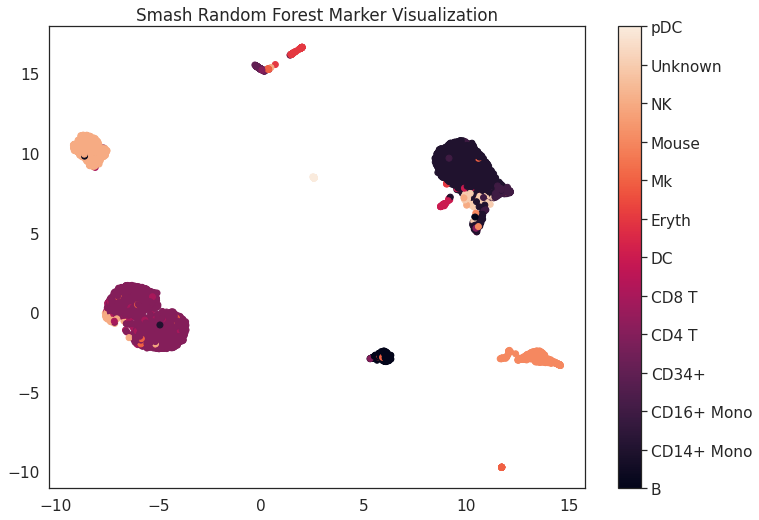

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

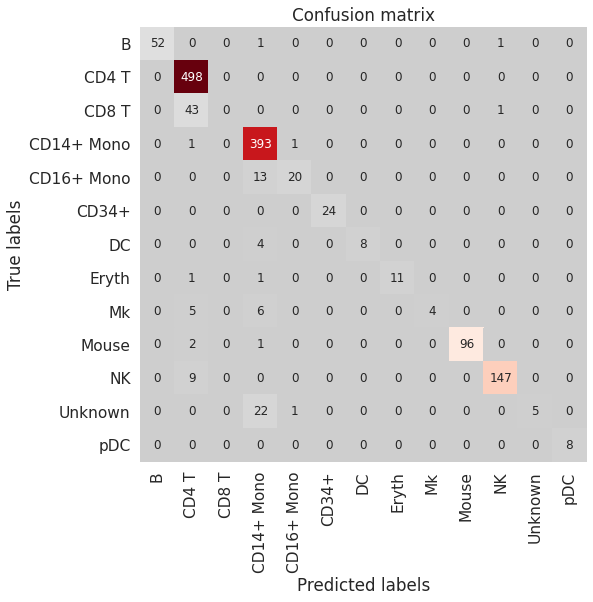

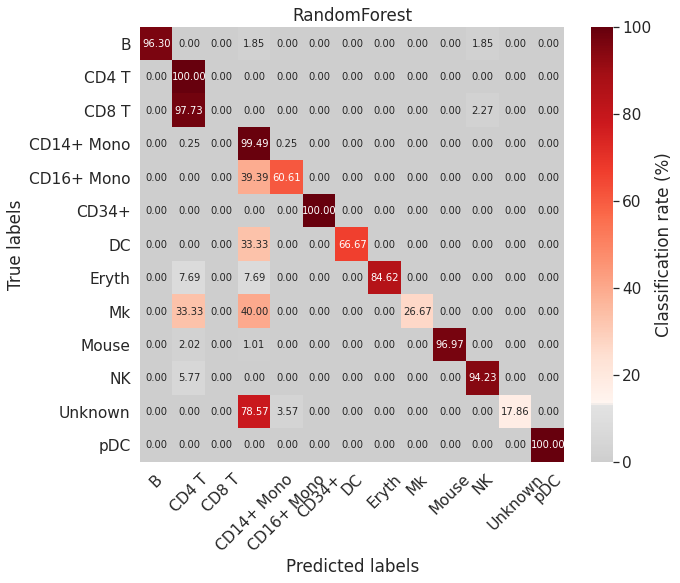

Accuracy: 0.9180565627266135: Misclassification: 0.08194343727338649
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        54
       CD4 T       0.89      1.00      0.94       498
       CD8 T       0.00      0.00      0.00        44
  CD14+ Mono       0.89      0.99      0.94       395
  CD16+ Mono       0.91      0.61      0.73        33
       CD34+       1.00      1.00      1.00        24
          DC       1.00      0.67      0.80        12
       Eryth       1.00      0.85      0.92        13
          Mk       1.00      0.27      0.42        15
       Mouse       1.00      0.97      0.98        99
          NK       0.99      0.94      0.96       156
     Unknown       1.00      0.18      0.30        28
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.73      0.77      1379
weighted avg       0.89      0.92      0.89      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



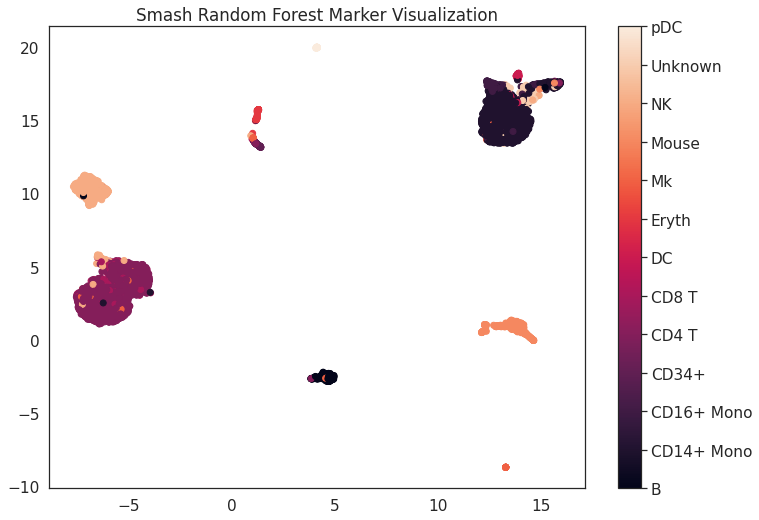

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

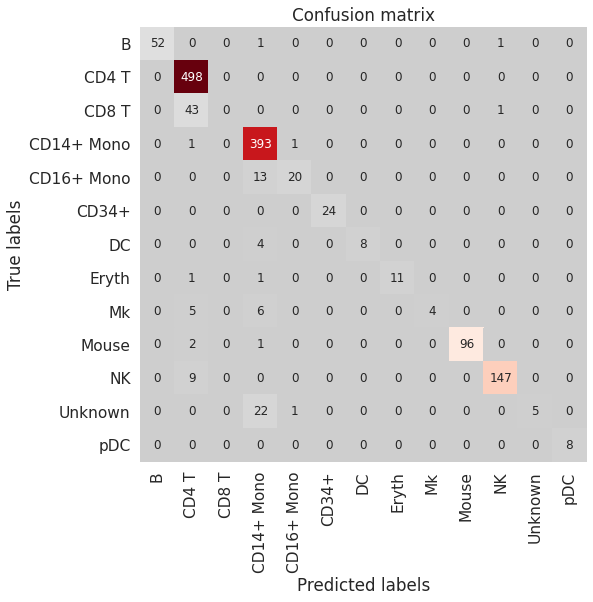

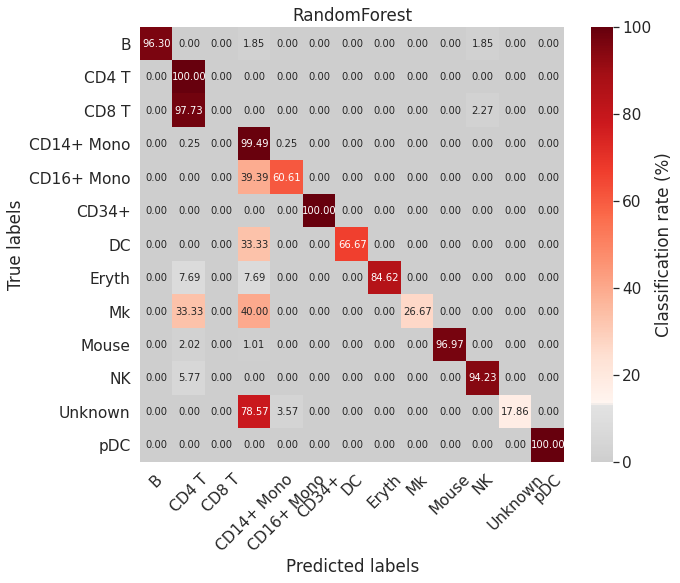

Accuracy: 0.9180565627266135: Misclassification: 0.08194343727338649
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        54
       CD4 T       0.89      1.00      0.94       498
       CD8 T       0.00      0.00      0.00        44
  CD14+ Mono       0.89      0.99      0.94       395
  CD16+ Mono       0.91      0.61      0.73        33
       CD34+       1.00      1.00      1.00        24
          DC       1.00      0.67      0.80        12
       Eryth       1.00      0.85      0.92        13
          Mk       1.00      0.27      0.42        15
       Mouse       1.00      0.97      0.98        99
          NK       0.99      0.94      0.96       156
     Unknown       1.00      0.18      0.30        28
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.73      0.77      1379
weighted avg       0.89      0.92      0.89      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



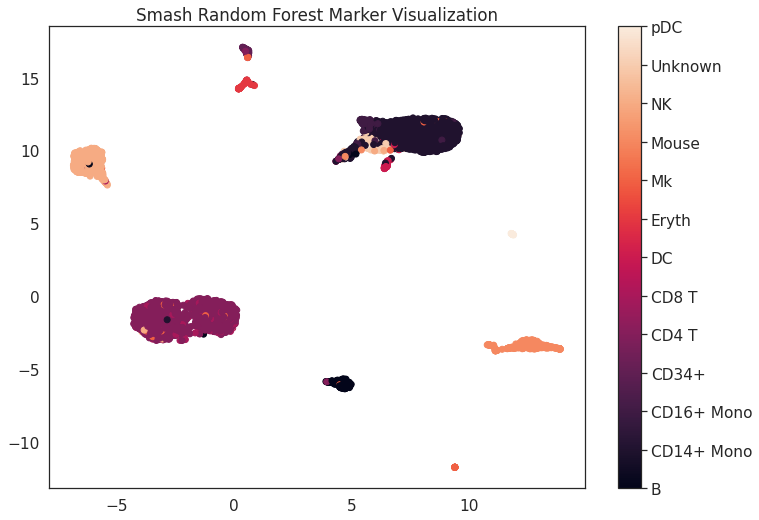

 * Initialising ...
Running with (Weighted) Random Forest


<Figure size 432x288 with 0 Axes>

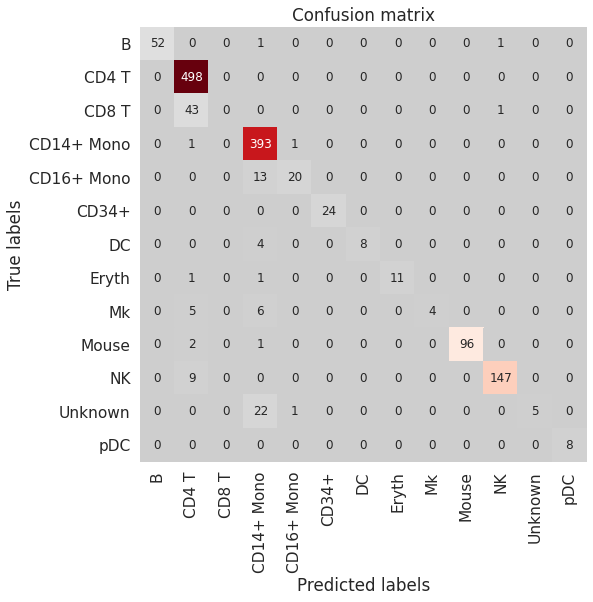

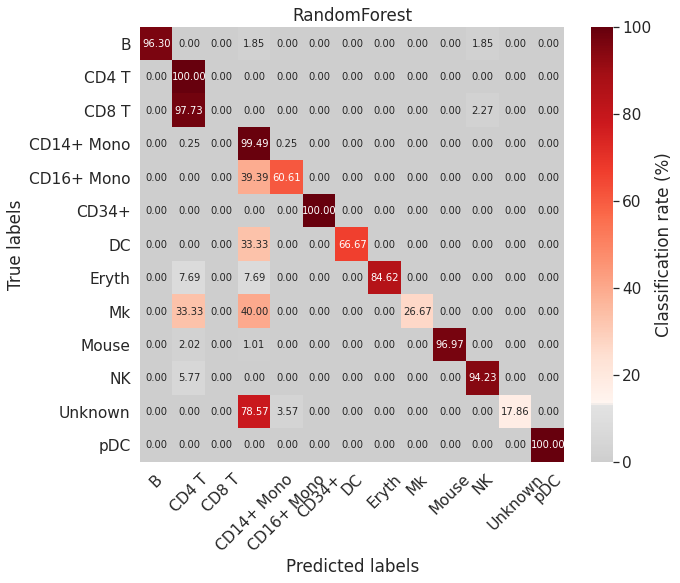

Accuracy: 0.9180565627266135: Misclassification: 0.08194343727338649
              precision    recall  f1-score   support

           B       1.00      0.96      0.98        54
       CD4 T       0.89      1.00      0.94       498
       CD8 T       0.00      0.00      0.00        44
  CD14+ Mono       0.89      0.99      0.94       395
  CD16+ Mono       0.91      0.61      0.73        33
       CD34+       1.00      1.00      1.00        24
          DC       1.00      0.67      0.80        12
       Eryth       1.00      0.85      0.92        13
          Mk       1.00      0.27      0.42        15
       Mouse       1.00      0.97      0.98        99
          NK       0.99      0.94      0.96       156
     Unknown       1.00      0.18      0.30        28
         pDC       1.00      1.00      1.00         8

    accuracy                           0.92      1379
   macro avg       0.90      0.73      0.77      1379
weighted avg       0.89      0.92      0.89      1379



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



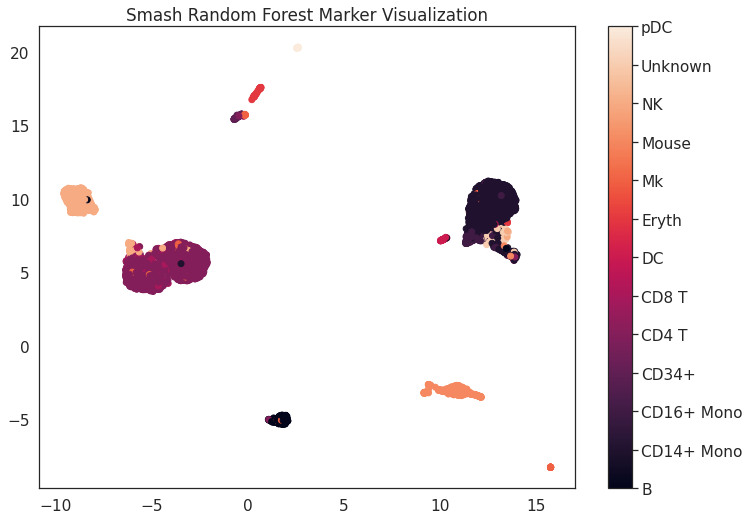

CPU times: user 4min 19s, sys: 7.78 s, total: 4min 26s
Wall time: 2min 20s


In [ ]:
%%time
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = citeseq_adata[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    clf = sm.ensemble_learning(train_X_y, group_by="annotation", classifier="RandomForest", balance=True, verbose=True)
    selectedGenes, selectedGenes_dict = sm.gini_importance(train_X_y, clf, group_by="annotation", verbose=True, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = citeseq_adata.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_rf_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'smash_rf_markers_{}.npy'.format(tryy), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_rf_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Random Forest Marker Visualization', path = viz_save_path + 'smash_rf_markers_{}.png'.format(tryy), markers = smash_markers)

In [ ]:
results

(0.06960556844547561,
 {'0': {'f1-score': 0.9864864864864865,
   'precision': 1.0,
   'recall': 0.9733333333333334,
   'support': 75},
  '1': {'f1-score': 0.9548022598870056,
   'precision': 0.9135135135135135,
   'recall': 1.0,
   'support': 507},
  '10': {'f1-score': 0.9923273657289001,
   'precision': 0.9897959183673469,
   'recall': 0.9948717948717949,
   'support': 195},
  '11': {'f1-score': 0.5957446808510638,
   'precision': 0.9333333333333333,
   'recall': 0.4375,
   'support': 32},
  '12': {'f1-score': 0.9523809523809523,
   'precision': 1.0,
   'recall': 0.9090909090909091,
   'support': 11},
  '2': {'f1-score': 0.8750000000000001,
   'precision': 1.0,
   'recall': 0.7777777777777778,
   'support': 54},
  '3': {'f1-score': 0.9583333333333334,
   'precision': 0.9583333333333334,
   'recall': 0.9583333333333334,
   'support': 24},
  '4': {'f1-score': 0.9451073985680192,
   'precision': 0.9013657056145675,
   'recall': 0.9933110367892977,
   'support': 598},
  '5': {'f1-score': 

## Train Smash DNN

the data is treated a bit differently than our other models

 * Initialising ...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                16032     
_________________________________________________________________
batch_normalization (BatchNo (None, 32)                128       
_________________________________________________________________
activation (Activation)      (None, 32)                0         
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_1 (Batch (None, 16)                64        
_________________________________________________________________
activation_1 (Activation)    (None, 

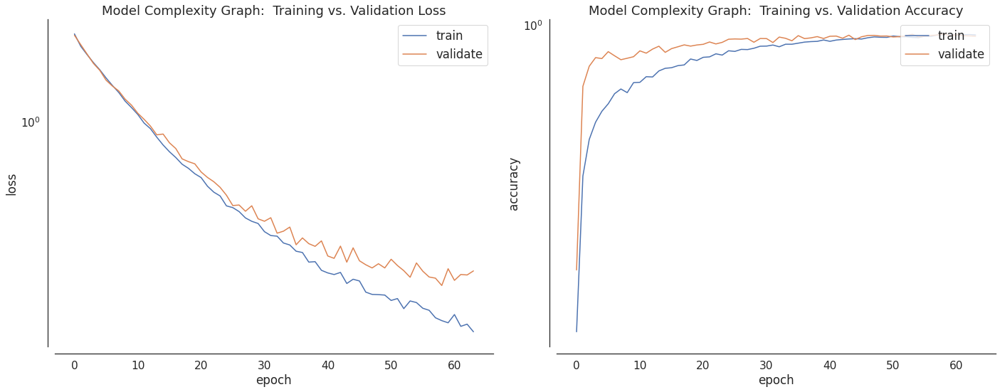

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

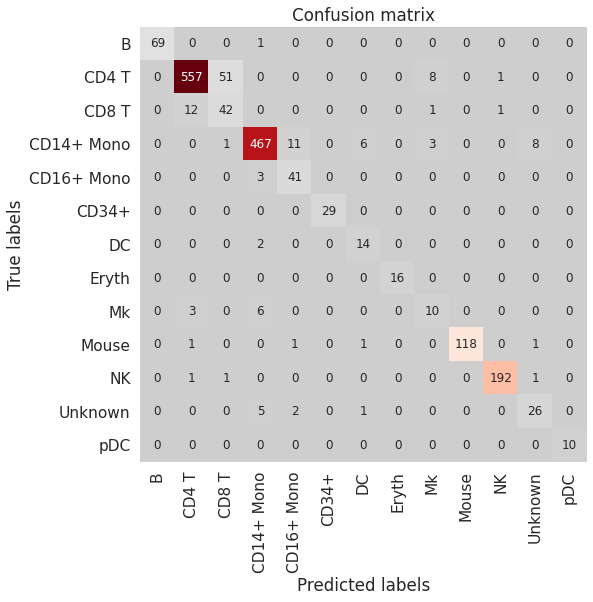

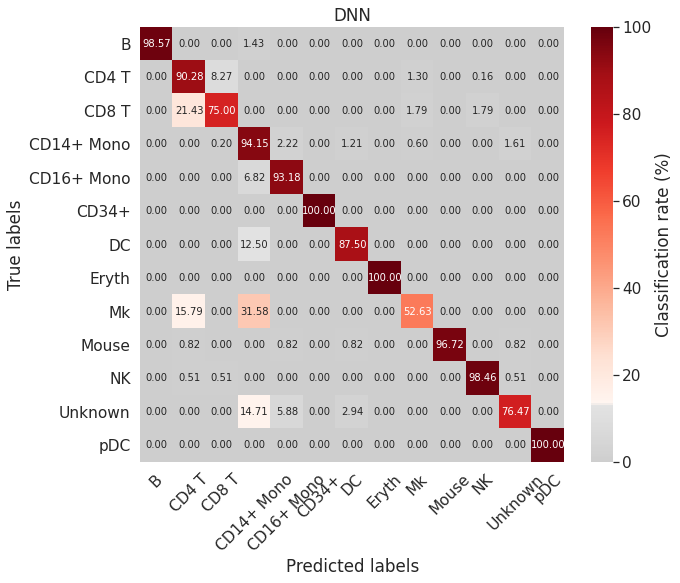

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 3ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:91: UserWarning:

keras is no longer supported, please use tf.keras instead.

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



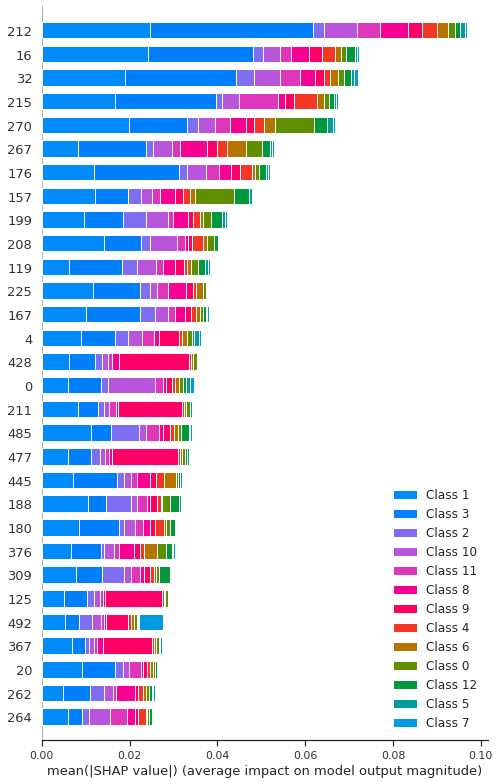

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



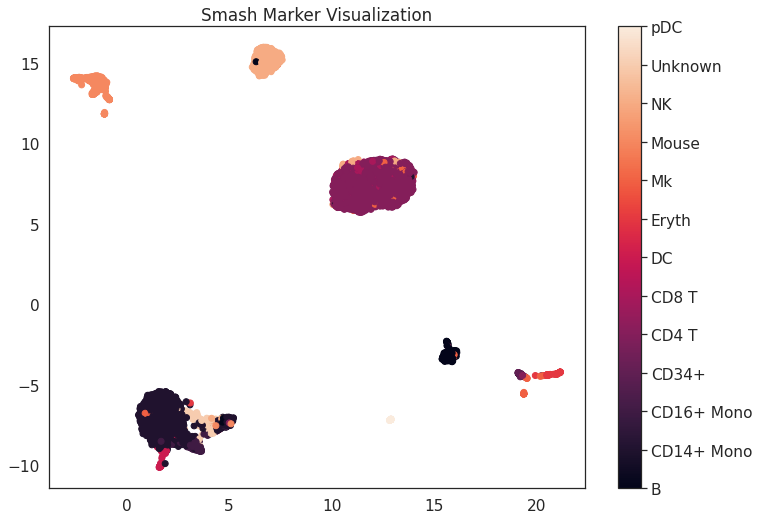

 * Initialising ...
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 32)                16032     
_________________________________________________________________
batch_normalization_4 (Batch (None, 32)                128       
_________________________________________________________________
activation_4 (Activation)    (None, 32)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_5 (Batch (None, 16)                64        
_________________________________________________________________
activation_5 (Activation)    (None

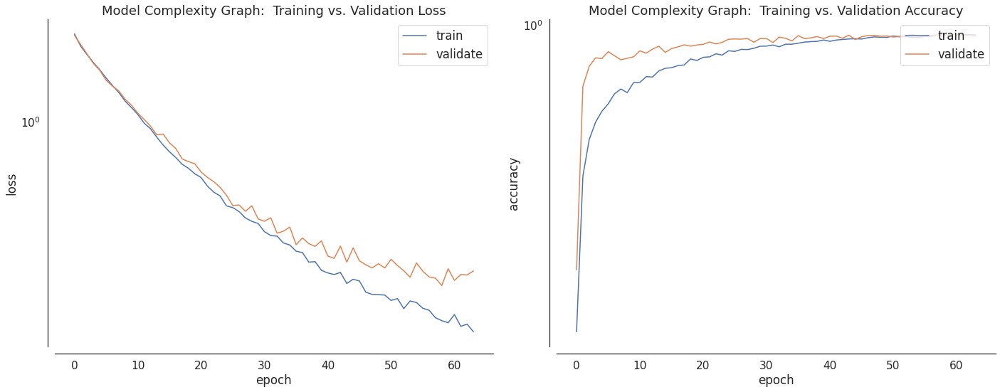

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

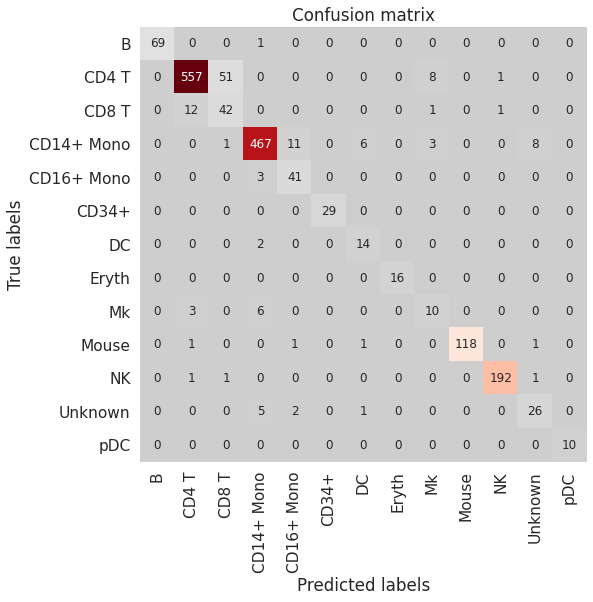

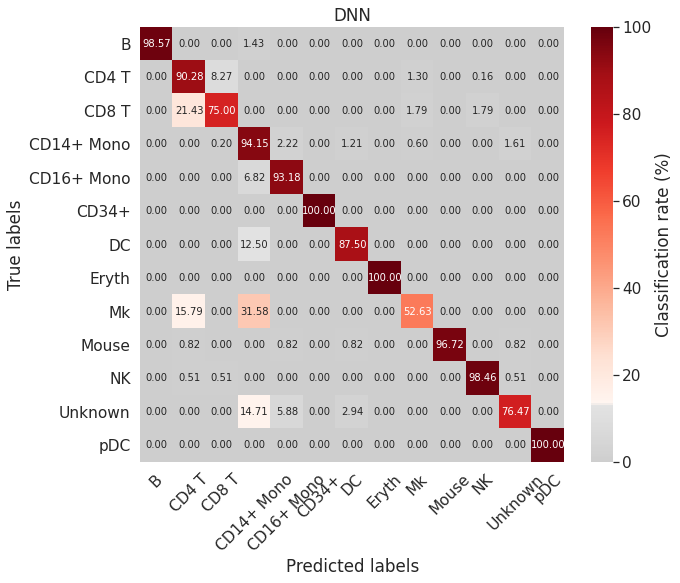

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 3ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



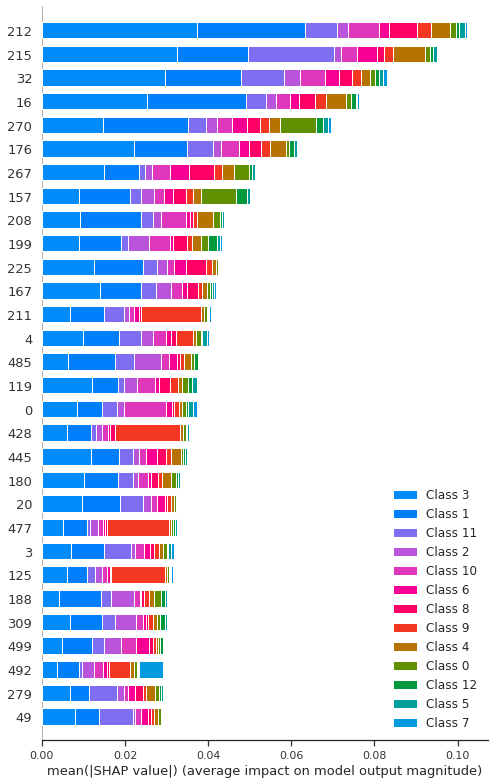

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



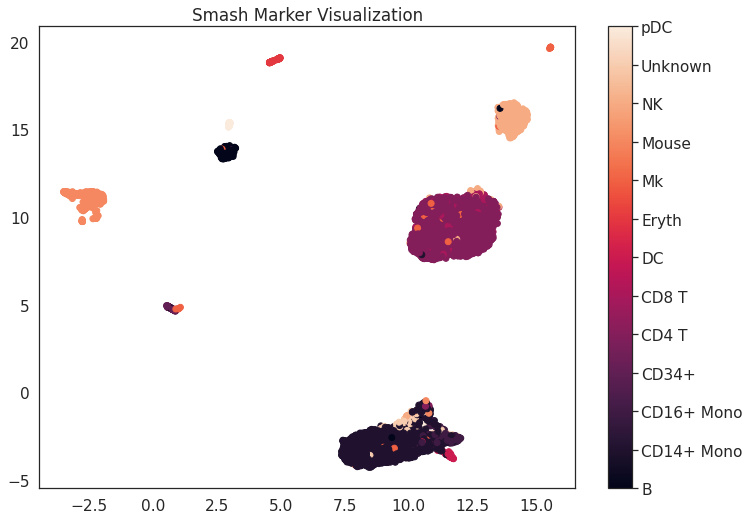

 * Initialising ...
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 32)                16032     
_________________________________________________________________
batch_normalization_8 (Batch (None, 32)                128       
_________________________________________________________________
activation_8 (Activation)    (None, 32)                0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_9 (Batch (None, 16)                64        
_________________________________________________________________
activation_9 (Activation)    (None

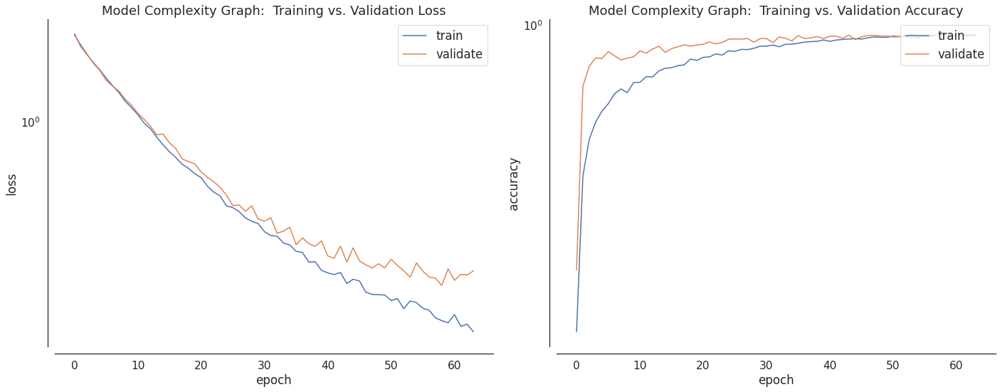

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

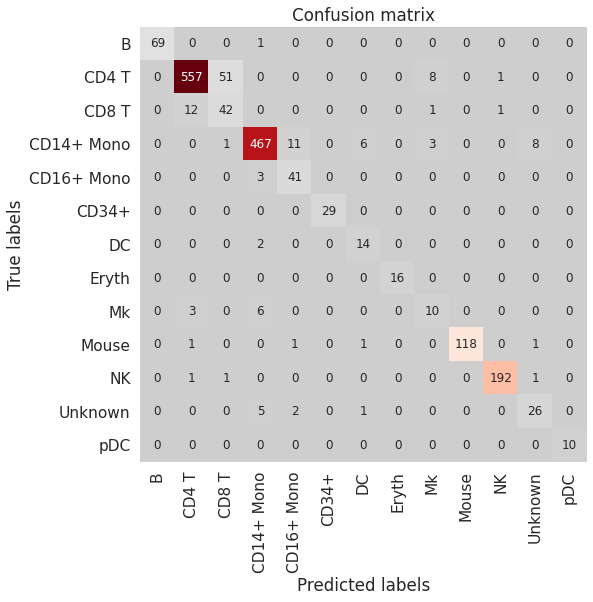

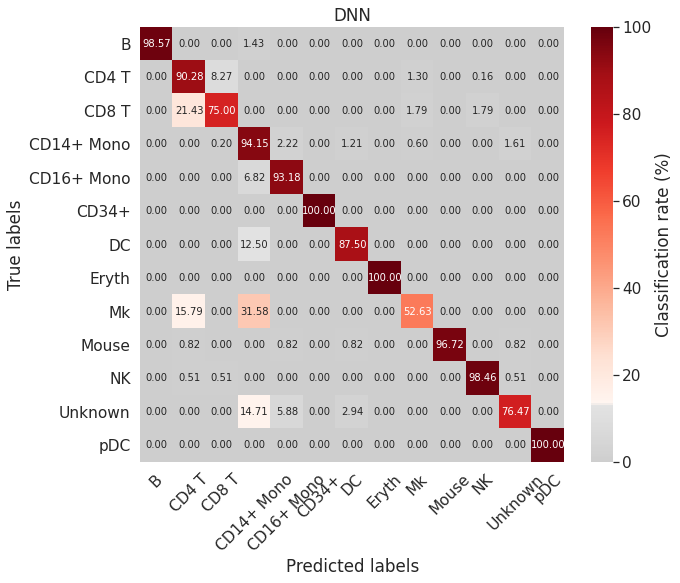

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 3ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



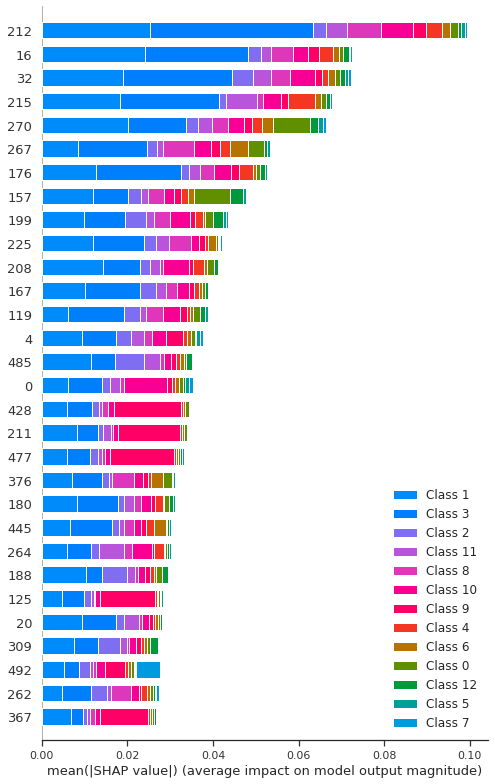

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



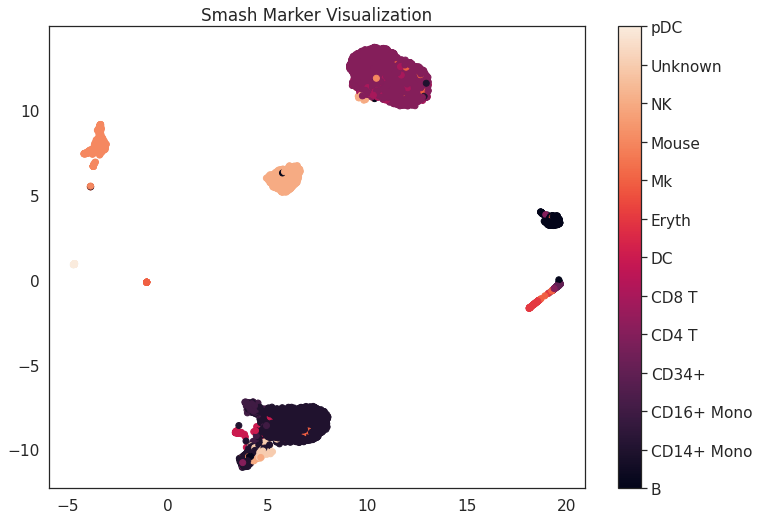

 * Initialising ...
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 32)                16032     
_________________________________________________________________
batch_normalization_12 (Batc (None, 32)                128       
_________________________________________________________________
activation_12 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_13 (Batc (None, 16)                64        
_________________________________________________________________
activation_13 (Activation)   (None

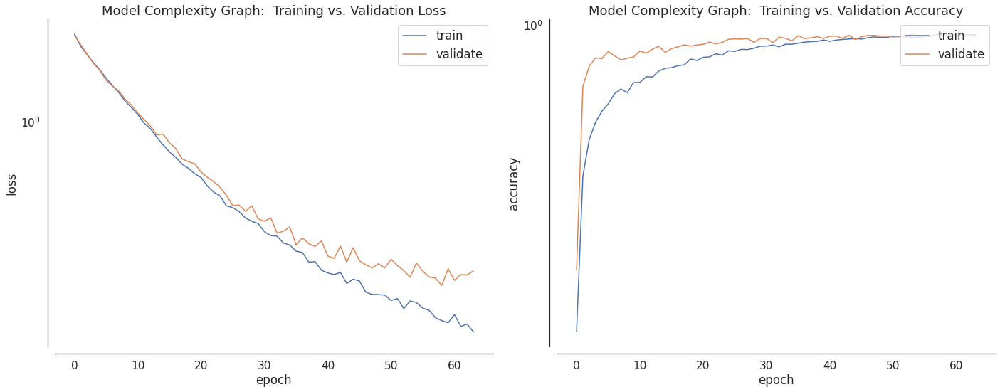

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

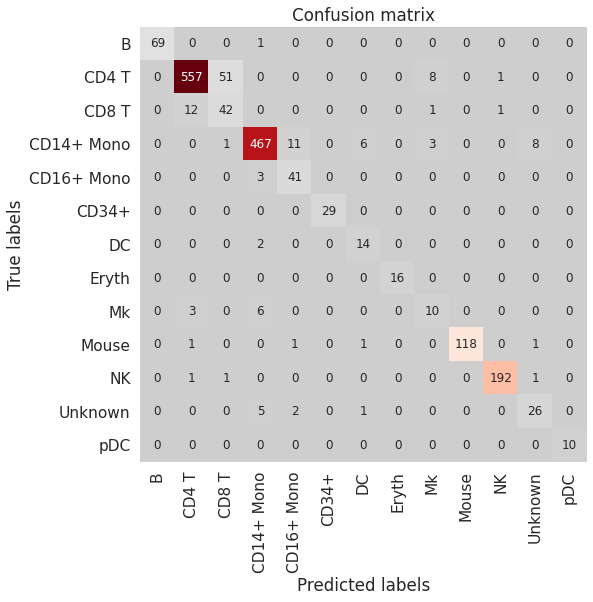

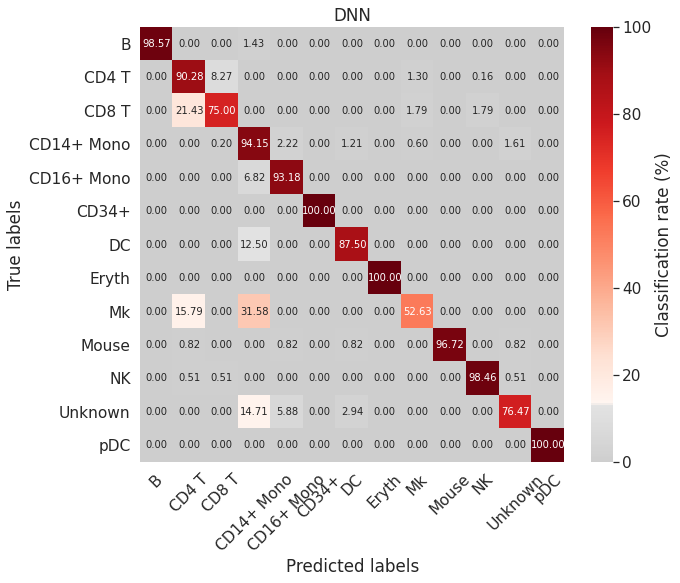

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 3ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



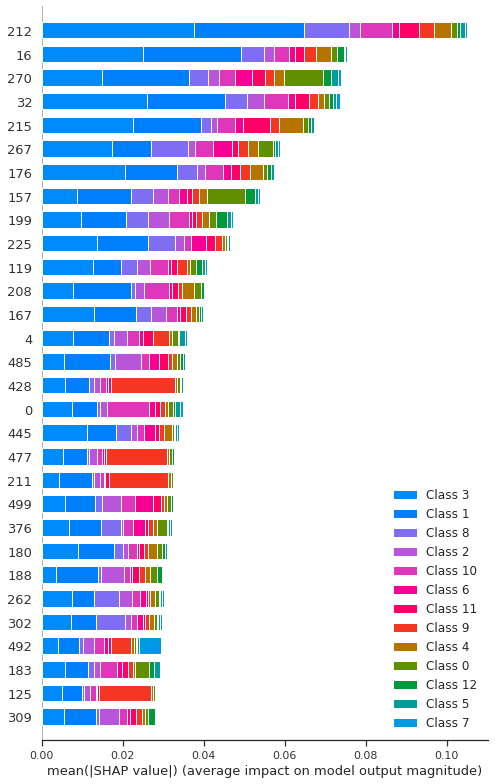

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



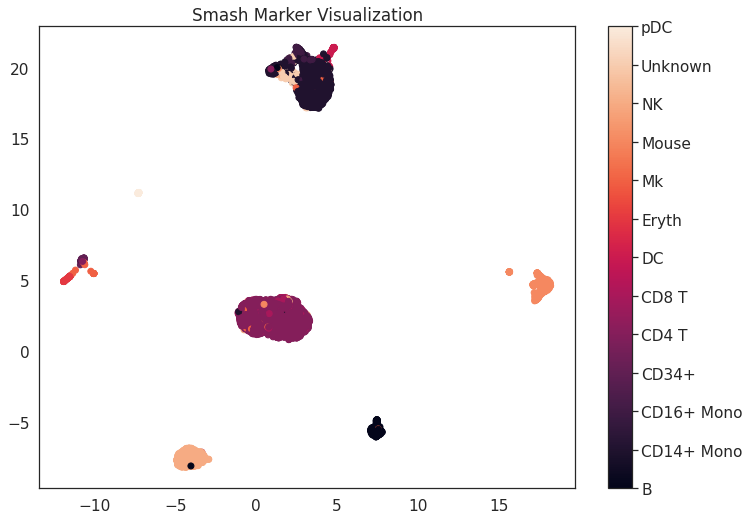

 * Initialising ...
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 32)                16032     
_________________________________________________________________
batch_normalization_16 (Batc (None, 32)                128       
_________________________________________________________________
activation_16 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_25 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_17 (Batc (None, 16)                64        
_________________________________________________________________
activation_17 (Activation)   (None

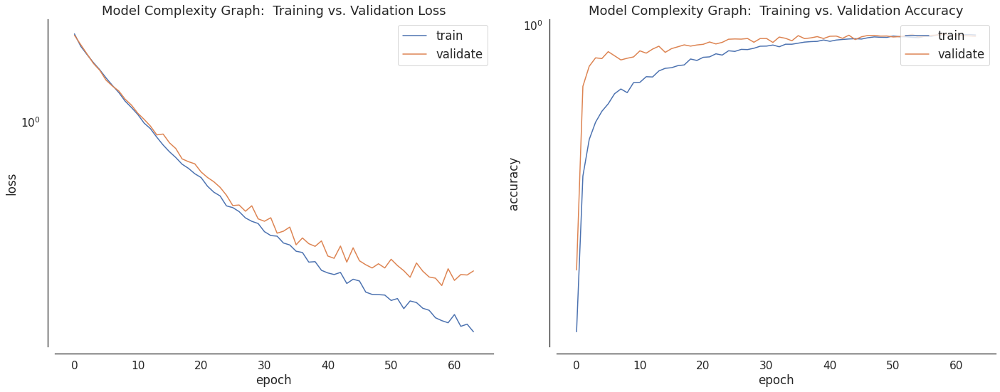

/usr/local/lib/python3.7/dist-packages/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

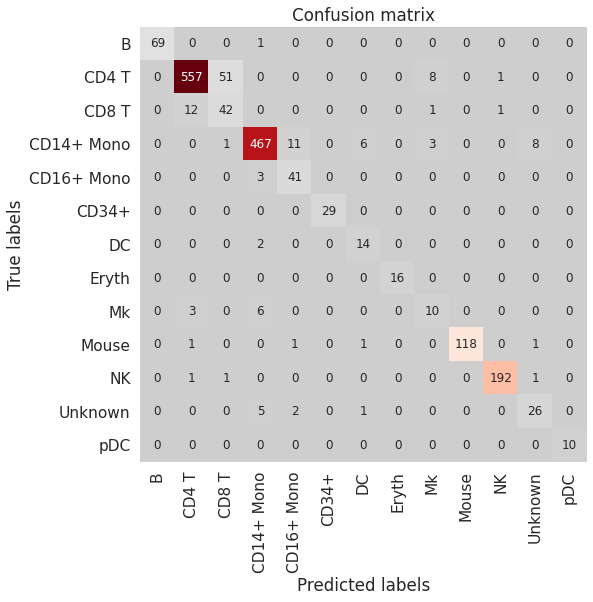

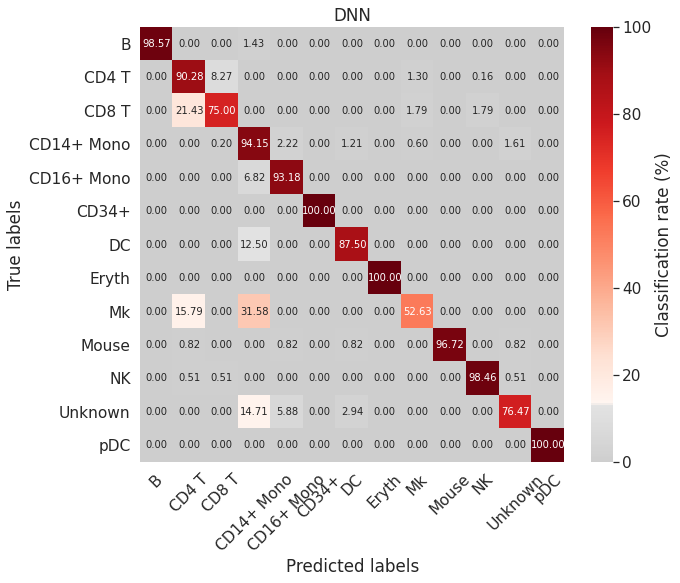

              precision    recall  f1-score   support

           B       1.00      0.99      0.99        70
       CD4 T       0.97      0.90      0.94       617
       CD8 T       0.44      0.75      0.56        56
  CD14+ Mono       0.96      0.94      0.95       496
  CD16+ Mono       0.75      0.93      0.83        44
       CD34+       1.00      1.00      1.00        29
          DC       0.64      0.88      0.74        16
       Eryth       1.00      1.00      1.00        16
          Mk       0.45      0.53      0.49        19
       Mouse       1.00      0.97      0.98       122
          NK       0.99      0.98      0.99       195
     Unknown       0.72      0.76      0.74        34
         pDC       1.00      1.00      1.00        10

    accuracy                           0.92      1724
   macro avg       0.84      0.89      0.86      1724
weighted avg       0.94      0.92      0.93      1724

54/54 [==============================] - 0s 3ms/step - loss: 0.2013 - accuracy:

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



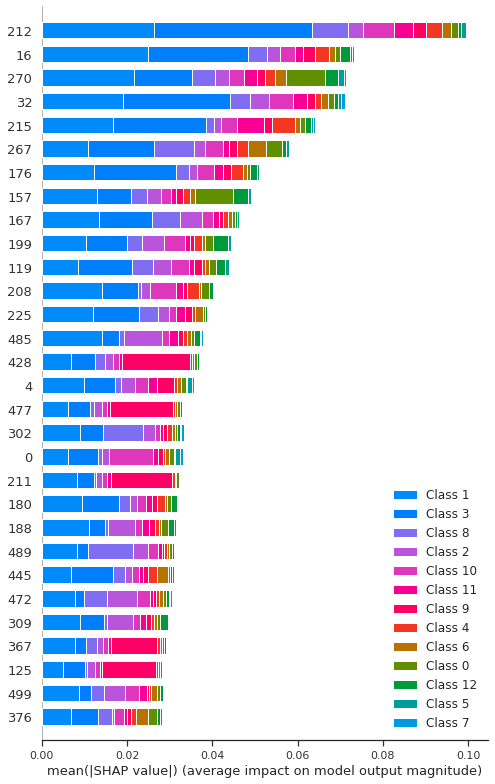

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



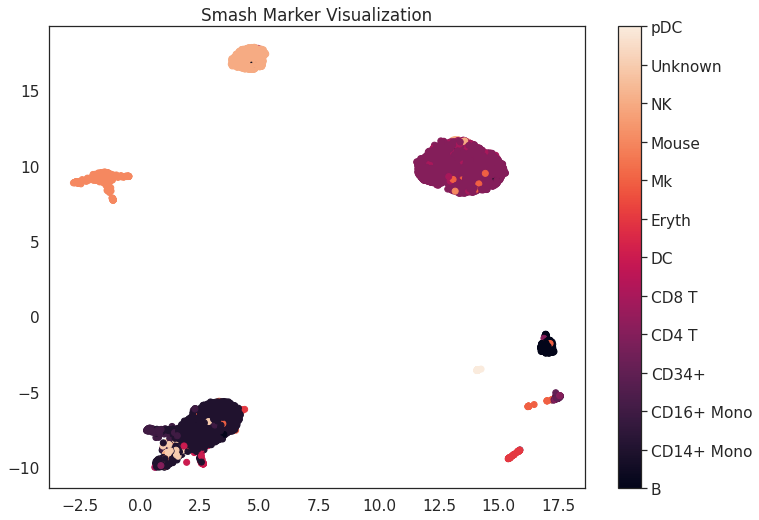

CPU times: user 8min 43s, sys: 47.2 s, total: 9min 30s
Wall time: 5min 59s


In [ ]:
%%time
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = citeseq_adata[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    sm.DNN(citeseq_adata, group_by="annotation", model=None, balance=True, verbose=True, save=False)
    selectedGenes, selectedGenes_dict = sm.run_shap(citeseq_adata, group_by="annotation", model=None, verbose=True, pct=0.1, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = citeseq_adata.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'smash_markers_{}.npy'.format(tryy), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Marker Visualization', path = viz_save_path + 'smash_markers_{}.png'.format(tryy), markers = smash_markers)

In [ ]:
results

(0.061484918793503485,
 {'0': {'f1-score': 0.9798657718120806,
   'precision': 0.9864864864864865,
   'recall': 0.9733333333333334,
   'support': 75},
  '1': {'f1-score': 0.9619771863117871,
   'precision': 0.9284403669724771,
   'recall': 0.9980276134122288,
   'support': 507},
  '10': {'f1-score': 0.9897959183673469,
   'precision': 0.9847715736040609,
   'recall': 0.9948717948717949,
   'support': 195},
  '11': {'f1-score': 0.6086956521739131,
   'precision': 1.0,
   'recall': 0.4375,
   'support': 32},
  '12': {'f1-score': 0.9523809523809523,
   'precision': 1.0,
   'recall': 0.9090909090909091,
   'support': 11},
  '2': {'f1-score': 0.9423076923076924,
   'precision': 0.98,
   'recall': 0.9074074074074074,
   'support': 54},
  '3': {'f1-score': 0.9583333333333334,
   'precision': 0.9583333333333334,
   'recall': 0.9583333333333334,
   'support': 24},
  '4': {'f1-score': 0.9504,
   'precision': 0.911042944785276,
   'recall': 0.9933110367892977,
   'support': 598},
  '5': {'f1-scor

## Train RankCorr

Excess Length of markers
53


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



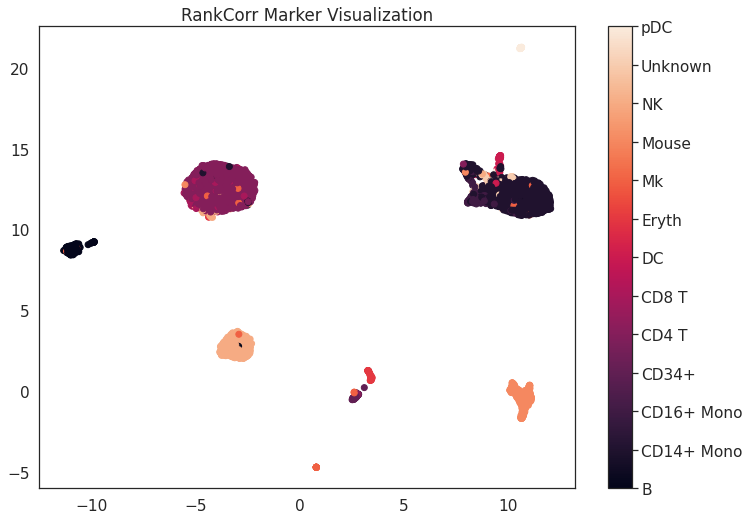

Excess Length of markers
52


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



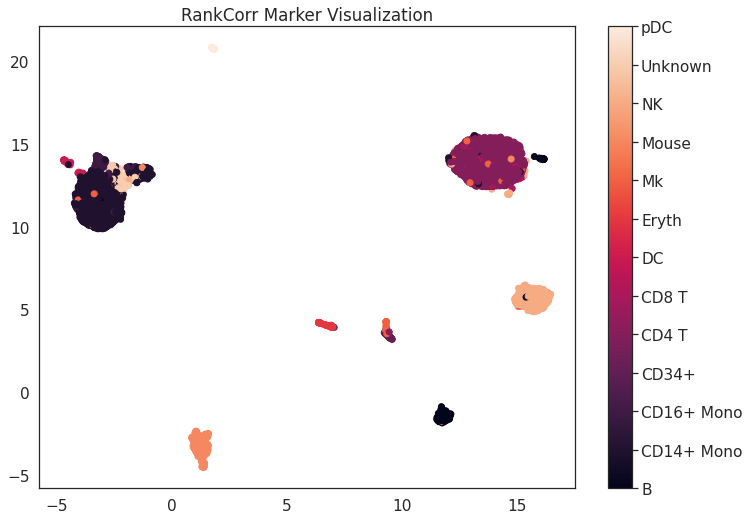

Excess Length of markers
55


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



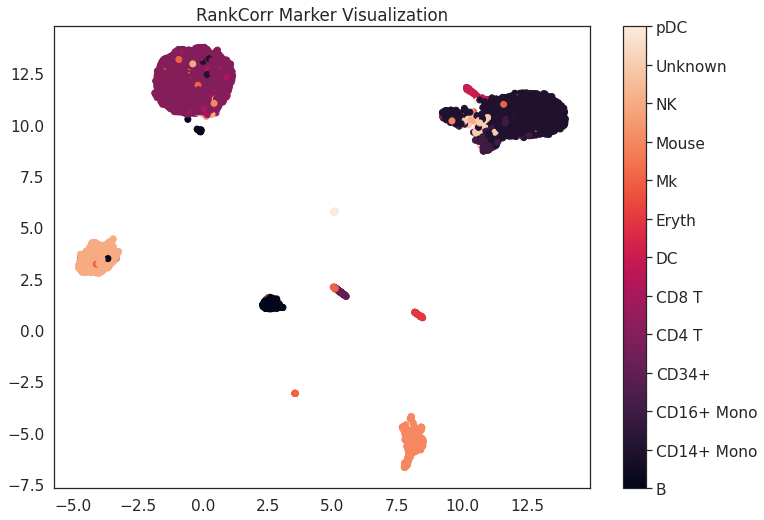

Excess Length of markers
56


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



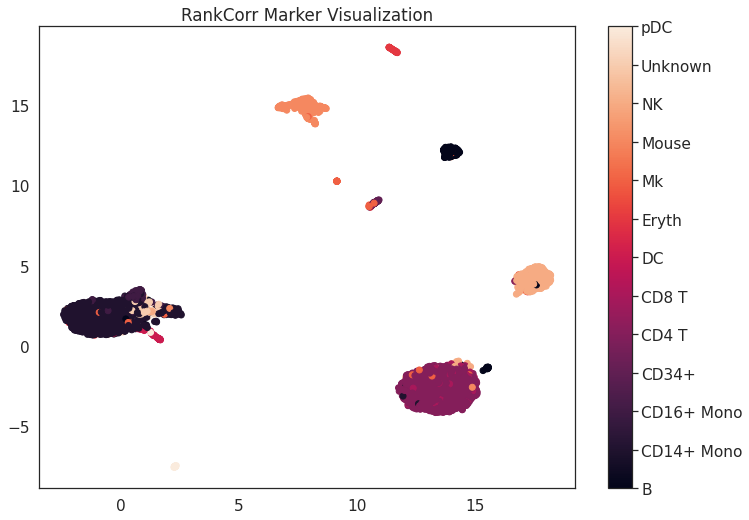

Excess Length of markers
56


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



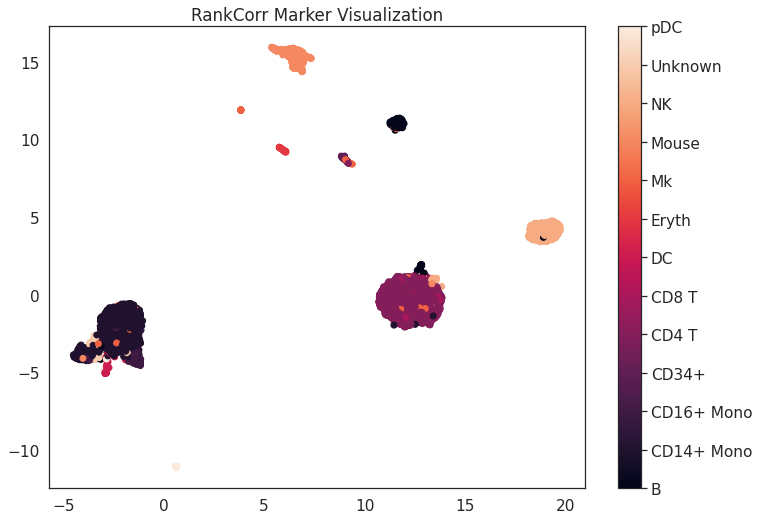

In [ ]:
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    data = Rocks(X_train, y_train)
    lamb = 3# this can be whatever

    rankcorr_markers = data.CSrankMarkers(lamb=lamb, writeOut=False, keepZeros=False, onlyNonZero=False)
    if len(rankcorr_markers) < k:
        raise Exception("Increase lamb for rank corr procedure")
    if len(rankcorr_markers) > k:
        print("Excess Length of markers")
        print(len(rankcorr_markers))
        rankcorr_markers = rankcorr_markers[:k]
    geneNames = np.array(citeseq_adata.var.index)
    data.genes = geneNames
    marker_genes = data.markers_to_genes(rankcorr_markers)
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = rankcorr_markers)
    np.save(model_save_path + 'rankcorr_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'rankcorr_markers_{}.npy'.format(tryy), rankcorr_markers)
    np.save(model_save_path + 'experiment_data_folds/rankcorr_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'RankCorr Marker Visualization', path = viz_save_path + 'rankcorr_markers_{}.png'.format(tryy), markers = rankcorr_markers)

In [ ]:
len(rankcorr_markers)

50

In [ ]:
print("Some, if not all, selected gene names")
print(marker_genes)

Some, if not all, selected gene names
['0', '3', '4', '262', '264', '265', '9', '267', '12', '270', '143', '144', '15', '272', '401', '407', '283', '27', '157', '158', '417', '35', '166', '172', '428', '302', '303', '176', '436', '53', '180', '445', '319', '199', '328', '330', '331', '208', '212', '215', '472', '345', '473', '346', '477', '350', '353', '225', '485', '359']


In [ ]:
results

(0.06844547563805103,
 {'0': {'f1-score': 0.980891719745223,
   'precision': 1.0,
   'recall': 0.9625,
   'support': 80},
  '1': {'f1-score': 0.9588235294117649,
   'precision': 0.9261363636363636,
   'recall': 0.9939024390243902,
   'support': 492},
  '10': {'f1-score': 0.9627507163323782,
   'precision': 0.9710982658959537,
   'recall': 0.9545454545454546,
   'support': 176},
  '11': {'f1-score': 0.5818181818181818,
   'precision': 0.9411764705882353,
   'recall': 0.42105263157894735,
   'support': 38},
  '12': {'f1-score': 1.0, 'precision': 1.0, 'recall': 1.0, 'support': 9},
  '2': {'f1-score': 0.8686868686868686,
   'precision': 0.86,
   'recall': 0.8775510204081632,
   'support': 49},
  '3': {'f1-score': 0.9855072463768115,
   'precision': 0.9714285714285714,
   'recall': 1.0,
   'support': 34},
  '4': {'f1-score': 0.9502677888293802,
   'precision': 0.9078947368421053,
   'recall': 0.9967897271268058,
   'support': 623},
  '5': {'f1-score': 0.1090909090909091,
   'precision': 0.6

## Train L1 VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 6.309573444801932e-08



Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



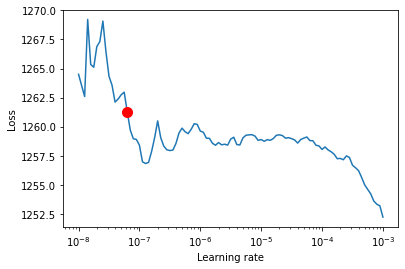

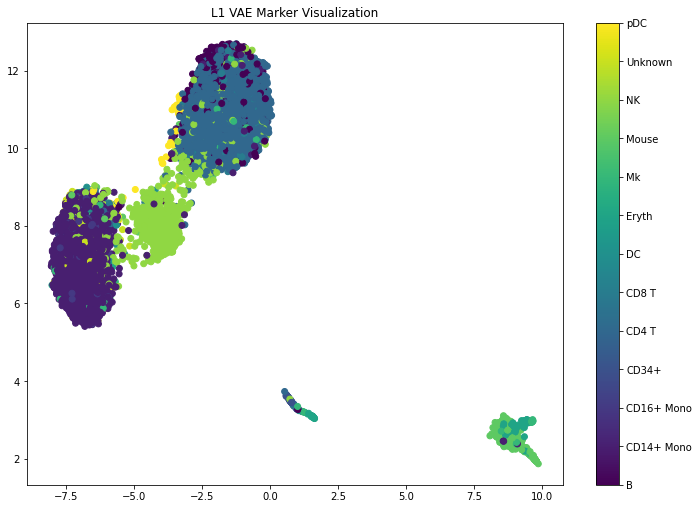

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 3.5481338923357545e-08


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



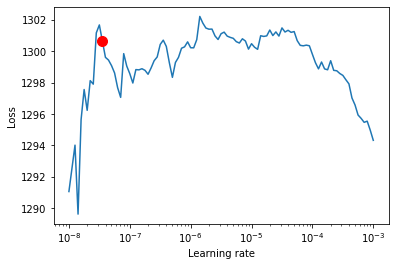

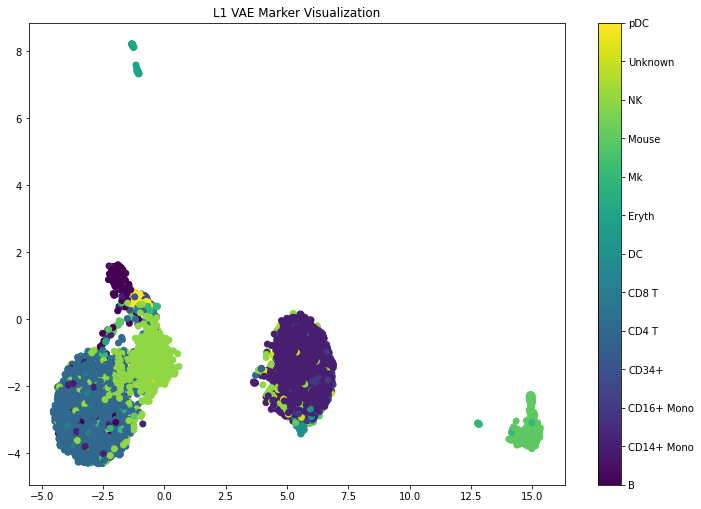

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 7.079457843841381e-08


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



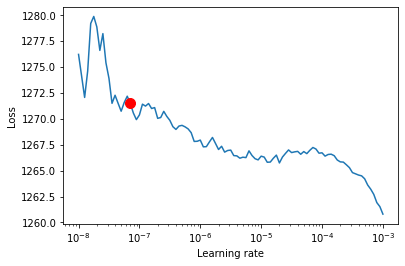

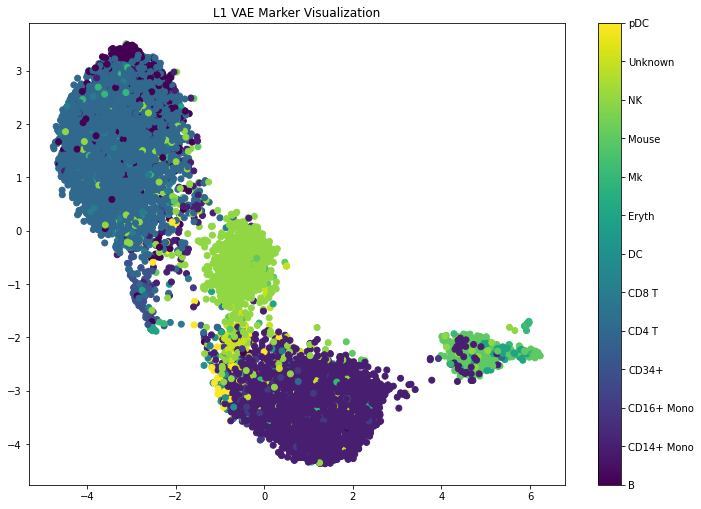

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 7.943282347242814e-08


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



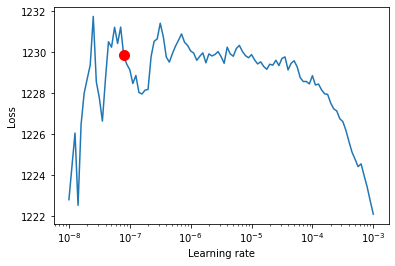

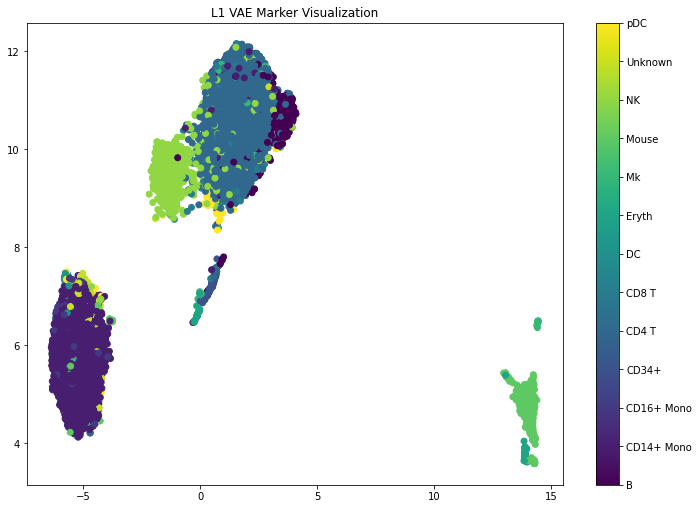

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 3.5481338923357545e-08


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



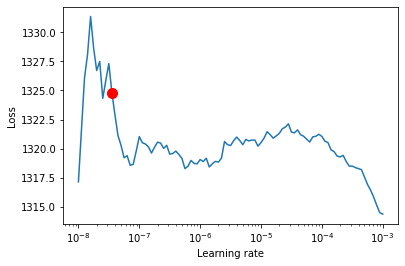

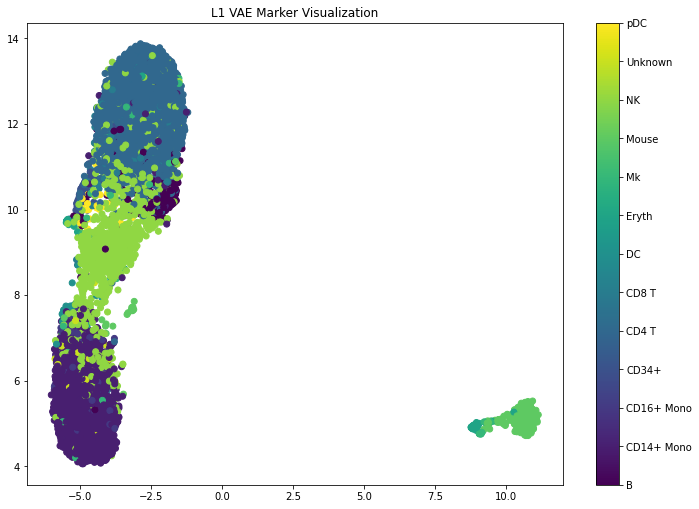

In [ ]:
feature_std = torch.tensor(X).std(dim = 0)
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_l1_diag(input_size, hidden_layer_size, z_size, batch_norm = batch_norm)
    tmp_path = model_save_path + 'l1_vae_{}.ckpt'.format(tryy)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=gpus, tpu_cores = tpu_cores, min_epochs = 25, 
                     max_epochs = 100, auto_lr = True, early_stopping_patience = 4, precision = 16)
    l1_markers = model.markers(feature_std = feature_std.to(model.device), k = k).clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = l1_markers)
    np.save(model_save_path + 'l1_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'l1_vae_markers_{}.npy'.format(tryy), l1_markers)
    np.save(model_save_path + 'experiment_data_folds/l1_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'L1 VAE Marker Visualization', path = viz_save_path + 'l1_vae_markers_{}.png'.format(tryy), markers = l1_markers)

In [ ]:
results

(0.11542923433874708,
 {'0': {'f1-score': 0.7384615384615385,
   'precision': 0.8888888888888888,
   'recall': 0.631578947368421,
   'support': 76},
  '1': {'f1-score': 0.9431818181818182,
   'precision': 0.89568345323741,
   'recall': 0.996,
   'support': 500},
  '10': {'f1-score': 0.9157894736842104,
   'precision': 0.9206349206349206,
   'recall': 0.9109947643979057,
   'support': 191},
  '11': {'f1-score': 0.1875,
   'precision': 1.0,
   'recall': 0.10344827586206896,
   'support': 29},
  '12': {'f1-score': 0.0, 'precision': 0.0, 'recall': 0.0, 'support': 10},
  '2': {'f1-score': 0.6363636363636365,
   'precision': 0.7241379310344828,
   'recall': 0.5675675675675675,
   'support': 37},
  '3': {'f1-score': 0.7719298245614035,
   'precision': 0.8148148148148148,
   'recall': 0.7333333333333333,
   'support': 30},
  '4': {'f1-score': 0.9202087994034303,
   'precision': 0.8533886583679114,
   'recall': 0.9983818770226537,
   'support': 618},
  '5': {'f1-score': 0.0, 'precision': 0.0, '

## Train Global Gate

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 1.1089e-06


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



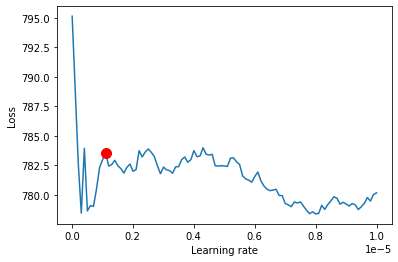

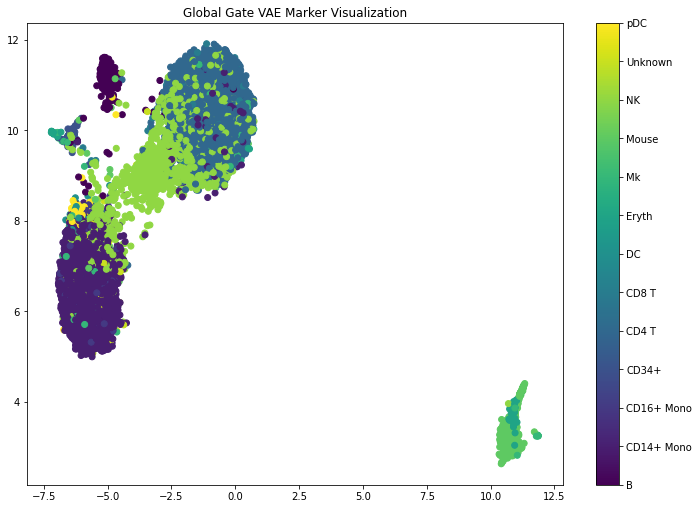

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 2.1079e-06


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



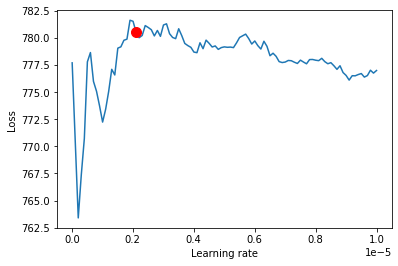

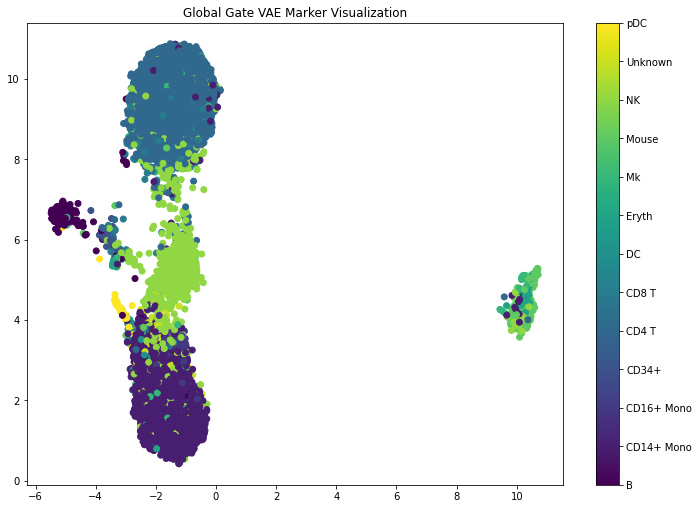

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 1.8082e-06


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



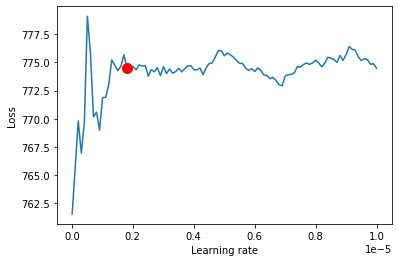

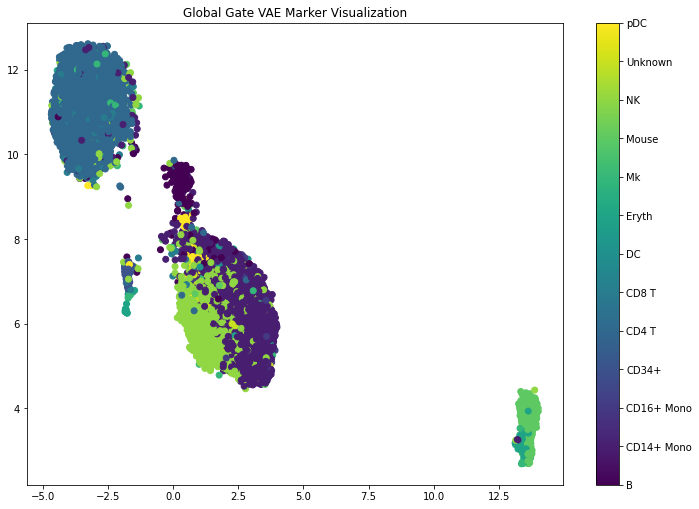

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 1.8082e-06


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



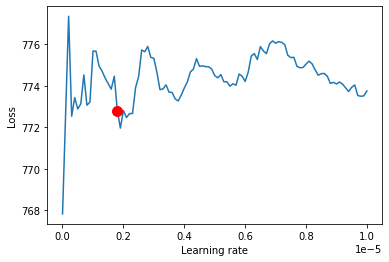

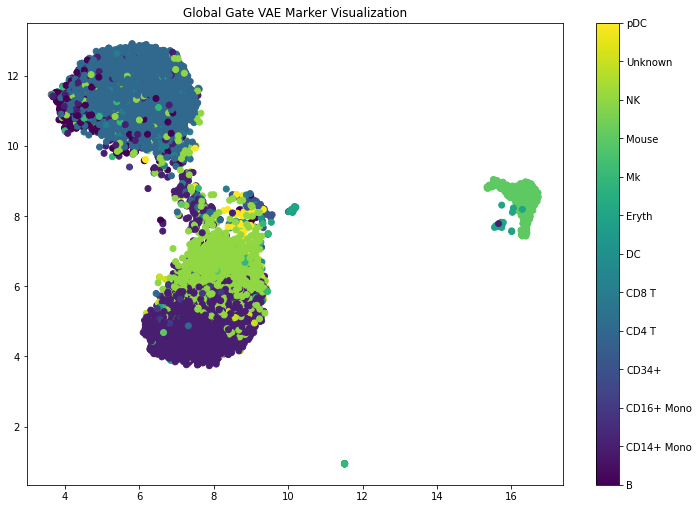

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 40.6 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
110 K     Trainable params
0         Non-trainable params
110 K     Total params
0.443     Total estimated model params size (MB)


New Learning Rate 2.2078000000000003e-06


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



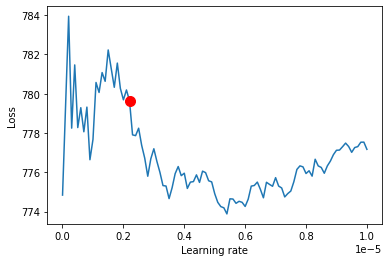

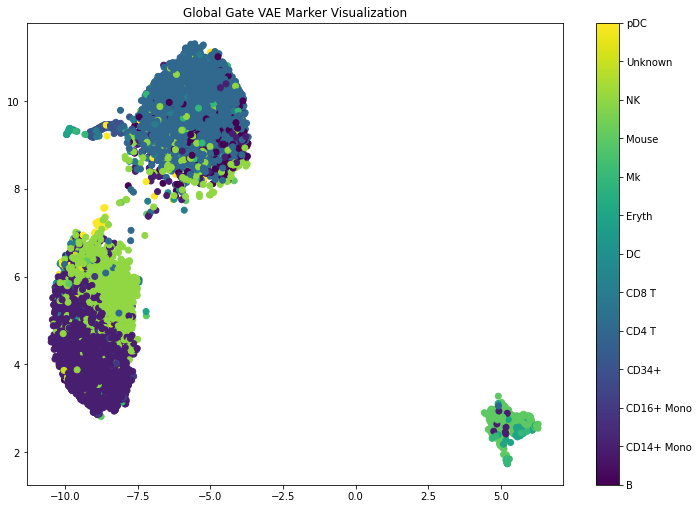

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers=num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_Gumbel_GlobalGate(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay=0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'globalgate_vae_{}.ckpt'.format(tryy)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus = gpus, tpu_cores = tpu_cores, 
                     min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.00001, early_stopping_patience =  10, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    globalgate_markers = model.markers().clone().cpu().detach().numpy()
    
 
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = globalgate_markers)
    np.save(model_save_path + 'globalgate_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'globalgate_vae_markers_{}.npy'.format(tryy), globalgate_markers)
    np.save(model_save_path + 'experiment_data_folds/globalgate_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Global Gate VAE Marker Visualization', path = viz_save_path + 'globalgate_vae_markers_{}.png'.format(tryy), markers = globalgate_markers)

In [ ]:
model.t

tensor(0.0178)

In [ ]:
results

(0.1653132250580046,
 {'0': {'f1-score': 0.2195121951219512,
   'precision': 1.0,
   'recall': 0.1232876712328767,
   'support': 73},
  '1': {'f1-score': 0.8852459016393444,
   'precision': 0.8024475524475524,
   'recall': 0.9870967741935484,
   'support': 465},
  '10': {'f1-score': 0.9150943396226415,
   'precision': 0.9463414634146341,
   'recall': 0.8858447488584474,
   'support': 219},
  '11': {'f1-score': 0.10256410256410257,
   'precision': 1.0,
   'recall': 0.05405405405405406,
   'support': 37},
  '12': {'f1-score': 0.0, 'precision': 0.0, 'recall': 0.0, 'support': 9},
  '2': {'f1-score': 0.047619047619047616,
   'precision': 1.0,
   'recall': 0.024390243902439025,
   'support': 41},
  '3': {'f1-score': 0.8301886792452831,
   'precision': 1.0,
   'recall': 0.7096774193548387,
   'support': 31},
  '4': {'f1-score': 0.889198606271777,
   'precision': 0.8045397225725095,
   'recall': 0.9937694704049844,
   'support': 642},
  '5': {'f1-score': 0.0, 'precision': 0.0, 'recall': 0.0, '

## Train Running State VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 2.1007900000000003e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



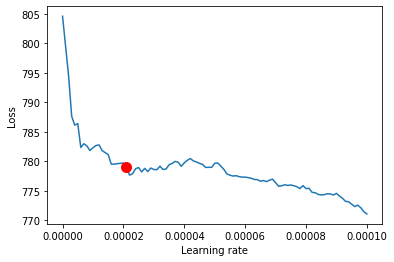

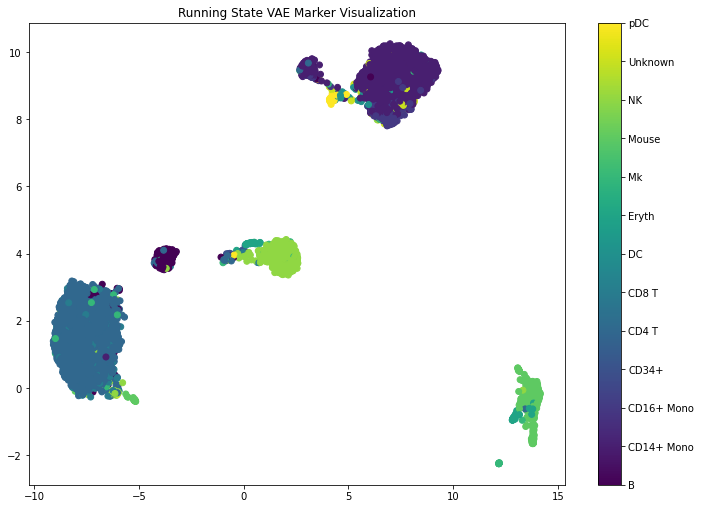

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 1.6008400000000004e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



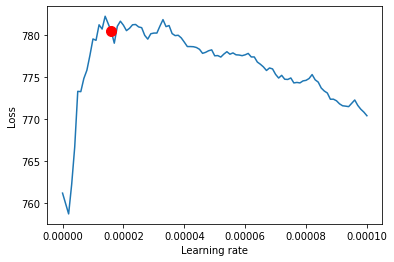

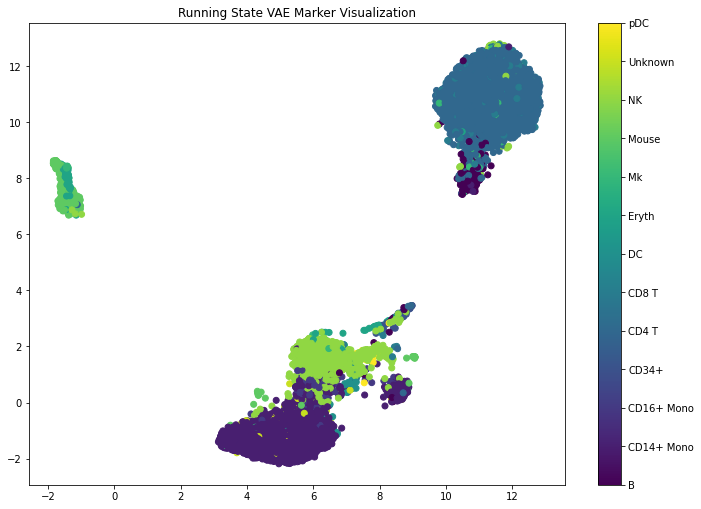

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 1.80082e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



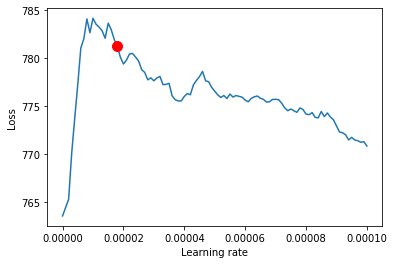

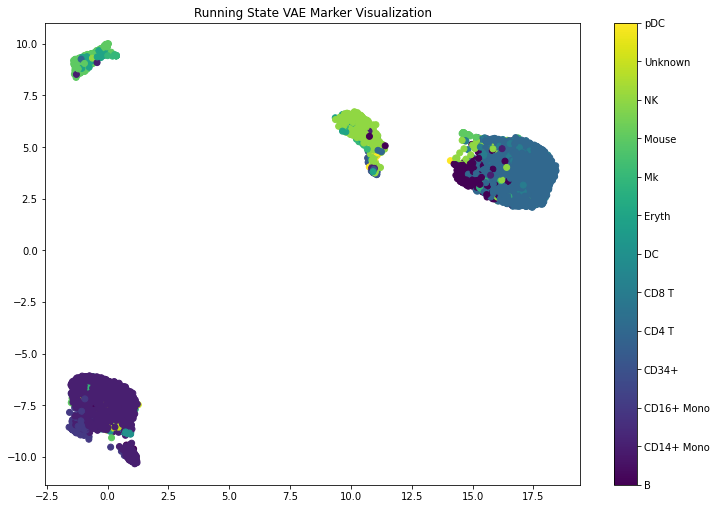

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 1.3008700000000001e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



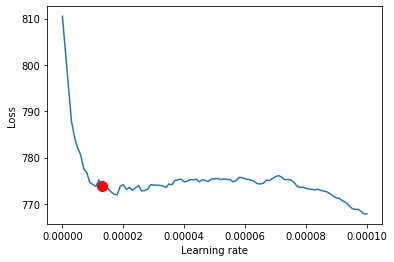

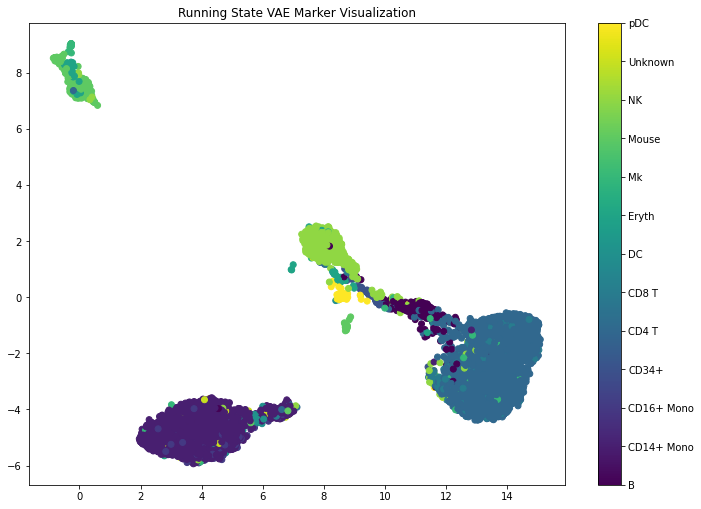

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 40.6 K
1 | enc_mean       | Linear     | 1.0 K 
2 | enc_logvar     | Linear     | 1.0 K 
3 | decoder        | Sequential | 33.7 K
4 | dec_logvar     | Sequential | 33.7 K
5 | weight_creator | Sequential | 69.0 K
----------------------------------------------
179 K     Trainable params
0         Non-trainable params
179 K     Total params
0.717     Total estimated model params size (MB)


New Learning Rate 1.2008800000000001e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



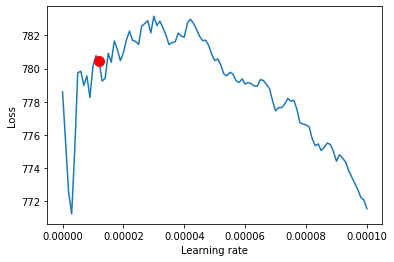

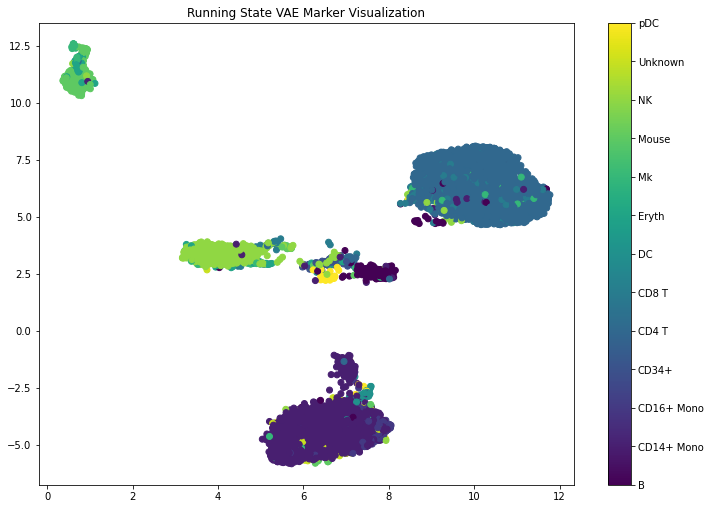

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    model = VAE_Gumbel_RunningState(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'runningstate_vae_{}.ckpt'.format(tryy)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 4, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'runningstate_vae_markers_{}.npy'.format(tryy), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State VAE Marker Visualization', path = viz_save_path + 'runningstate_vae_markers_{}.png'.format(tryy), markers = runningstate_markers)

In [ ]:
model.t

tensor(0.4272)

In [ ]:
results

(0.08120649651972156,
 {'0': {'f1-score': 0.9387755102040817,
   'precision': 0.92,
   'recall': 0.9583333333333334,
   'support': 72},
  '1': {'f1-score': 0.9506172839506173,
   'precision': 0.9166666666666666,
   'recall': 0.9871794871794872,
   'support': 468},
  '10': {'f1-score': 0.9471365638766519,
   'precision': 0.9513274336283186,
   'recall': 0.9429824561403509,
   'support': 228},
  '11': {'f1-score': 0.30769230769230765,
   'precision': 0.8571428571428571,
   'recall': 0.1875,
   'support': 32},
  '12': {'f1-score': 0.8571428571428571,
   'precision': 0.8571428571428571,
   'recall': 0.8571428571428571,
   'support': 7},
  '2': {'f1-score': 0.7692307692307692,
   'precision': 0.7575757575757576,
   'recall': 0.78125,
   'support': 32},
  '3': {'f1-score': 0.8918918918918919,
   'precision': 0.9428571428571428,
   'recall': 0.8461538461538461,
   'support': 39},
  '4': {'f1-score': 0.948159278737791,
   'precision': 0.9040114613180515,
   'recall': 0.9968404423380727,
   'su

In [ ]:
model.t

tensor(0.4272)

## Running State Classifier

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0007400026000000001


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



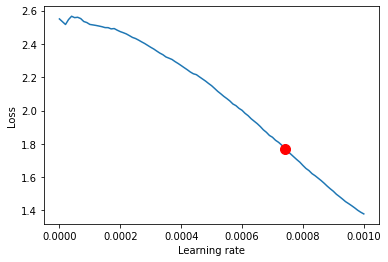

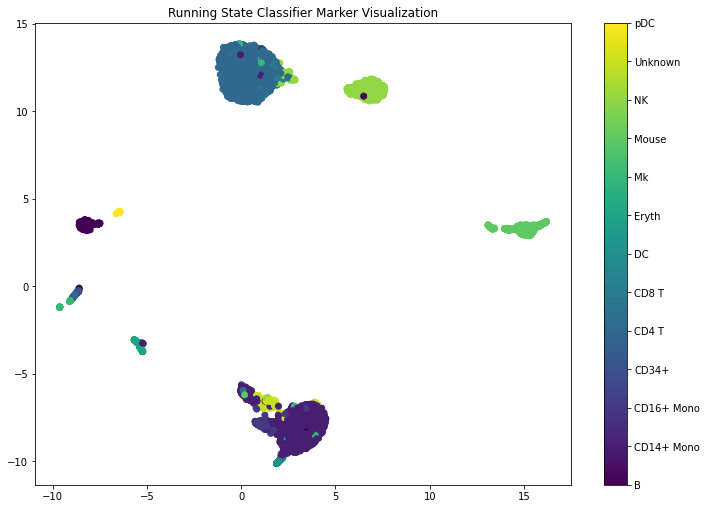

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0009100009000000002


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



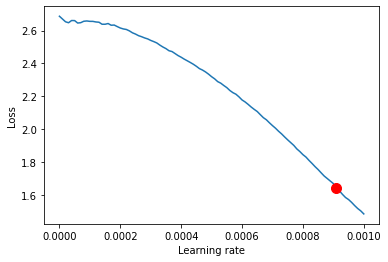

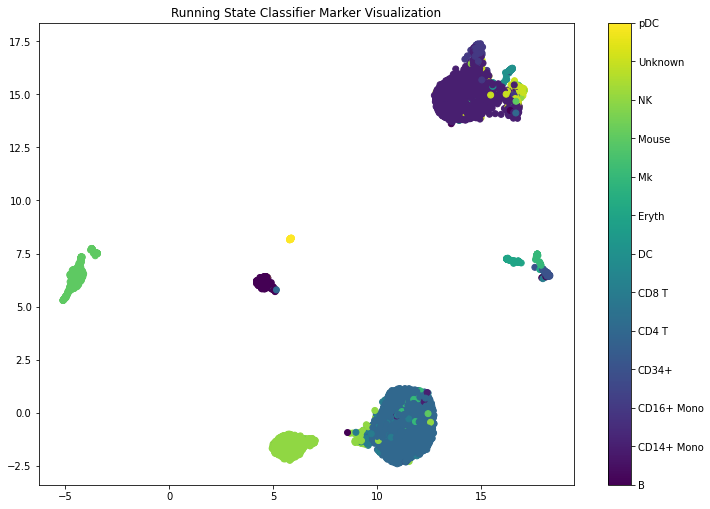

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0005700043


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



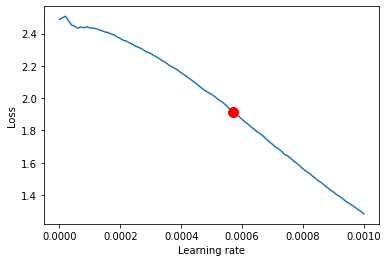

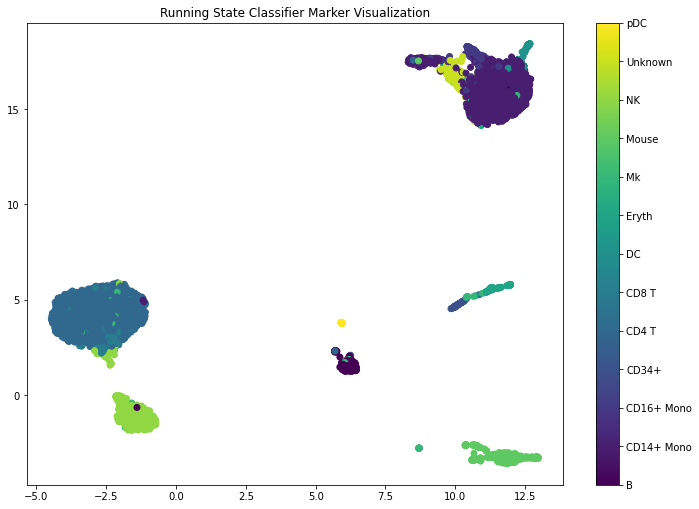

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0007900021000000002


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



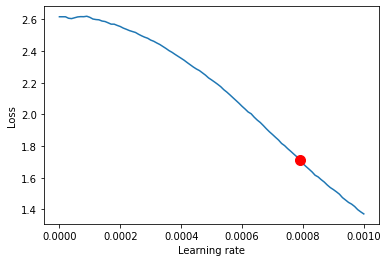

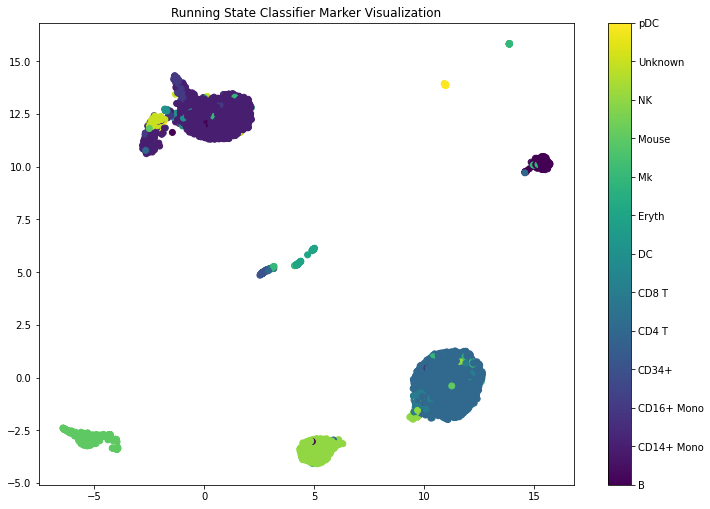

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 41.7 K
1 | decoder        | Sequential | 2.1 K 
2 | weight_creator | Sequential | 69.0 K
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
112 K     Trainable params
0         Non-trainable params
112 K     Total params
0.451     Total estimated model params size (MB)


New Learning Rate 0.0006900031


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



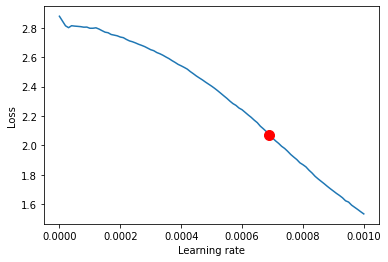

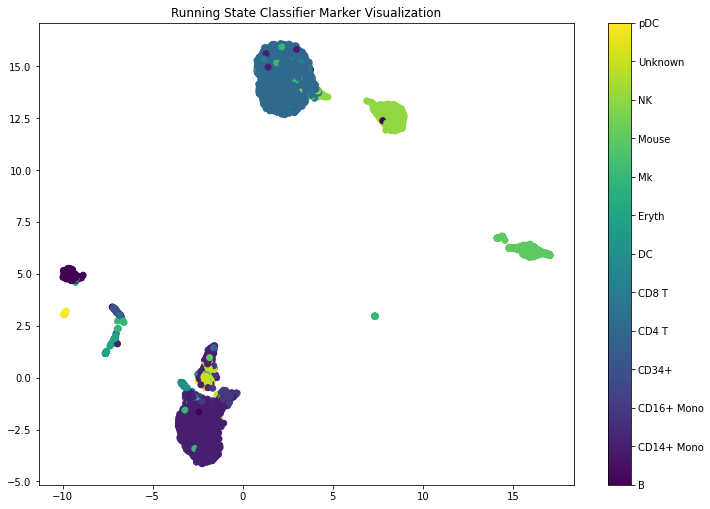

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    
    model = GumbelClassifier(input_size, hidden_layer_size, z_size, num_classes = len(encoder.classes_), 
                             k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95, batch_norm = batch_norm)
    tmp_path = model_save_path + 'runningstate_classifier_{}.ckpt'.format(tryy)
    # DO NOT USE IN OTHER WORKLOADS
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=gpus, tpu_cores = tpu_cores, 
                     min_epochs = 25, max_epochs = 100, auto_lr = True, early_stopping_patience = 3, precision = 16, lr_explore_mode = 'linear', num_lr_rates=500)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_classifier_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'runningstate_classifier_markers_{}.npy'.format(tryy), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_classifier_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State Classifier Marker Visualization', path = viz_save_path + 'runningstate_classifier_markers_{}.png'.format(tryy), markers = runningstate_markers)

In [ ]:
model.lr

0.0006900031

In [ ]:
model.t

tensor(0.8322)

In [ ]:
model.hparams.lr

0.0006900031

In [ ]:
results

(0.06786542923433869,
 {'0': {'f1-score': 0.9746835443037974,
   'precision': 0.9746835443037974,
   'recall': 0.9746835443037974,
   'support': 79},
  '1': {'f1-score': 0.958167330677291,
   'precision': 0.9303675048355899,
   'recall': 0.9876796714579056,
   'support': 487},
  '10': {'f1-score': 0.9763779527559054,
   'precision': 0.96875,
   'recall': 0.9841269841269841,
   'support': 189},
  '11': {'f1-score': 0.5,
   'precision': 0.8461538461538461,
   'recall': 0.3548387096774194,
   'support': 31},
  '12': {'f1-score': 1.0, 'precision': 1.0, 'recall': 1.0, 'support': 18},
  '2': {'f1-score': 0.8275862068965516,
   'precision': 0.9,
   'recall': 0.7659574468085106,
   'support': 47},
  '3': {'f1-score': 0.96, 'precision': 0.96, 'recall': 0.96, 'support': 25},
  '4': {'f1-score': 0.9489164086687307,
   'precision': 0.9081481481481481,
   'recall': 0.993517017828201,
   'support': 617},
  '5': {'f1-score': 0.2424242424242424,
   'precision': 0.7272727272727273,
   'recall': 0.14545

## Concrete VAE

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


New Learning Rate 5.200480000000001e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



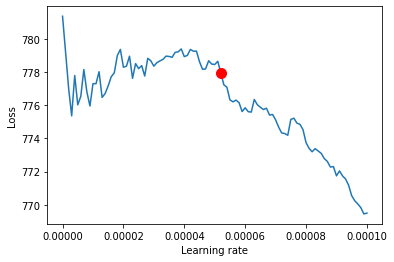

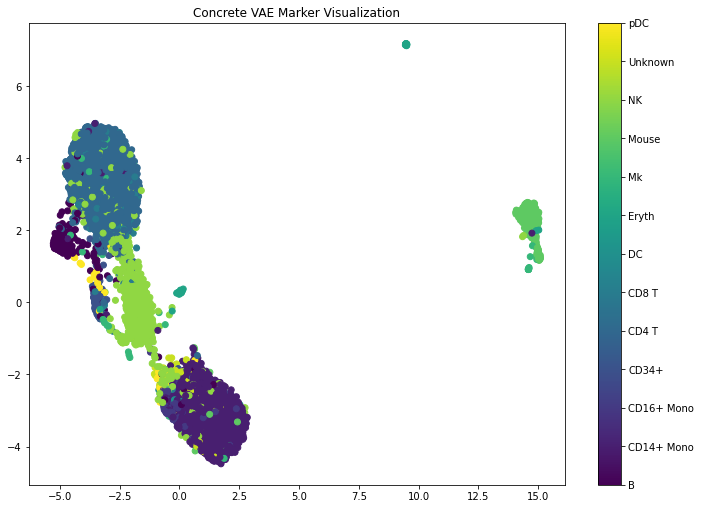

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


New Learning Rate 4.500550000000001e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



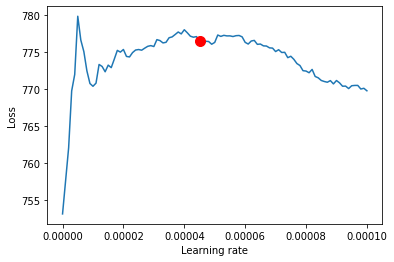

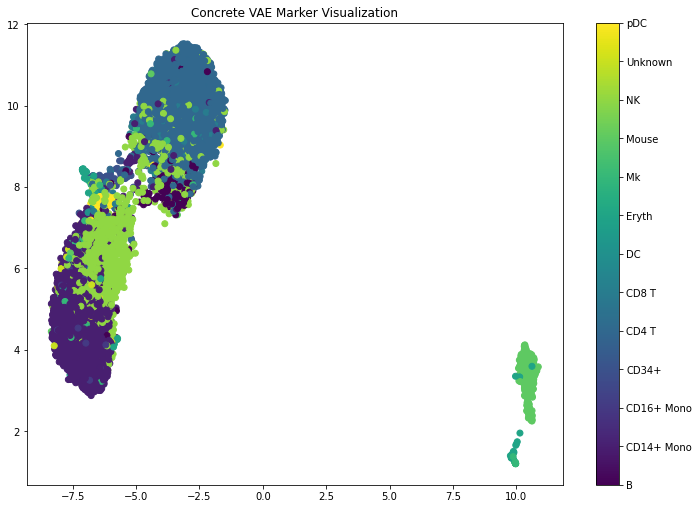

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


New Learning Rate 4.2005800000000004e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



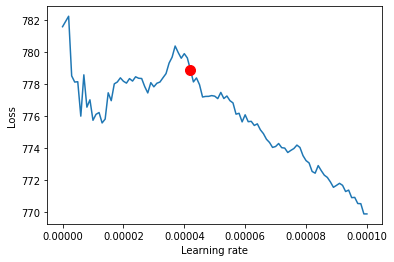

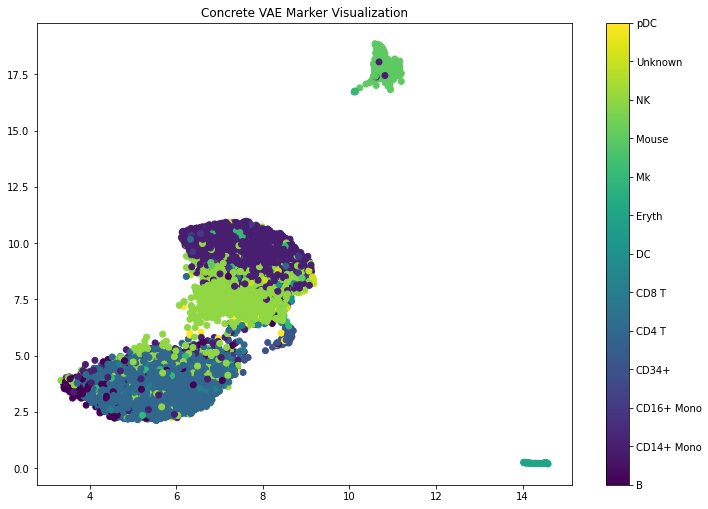

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


New Learning Rate 3.60064e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



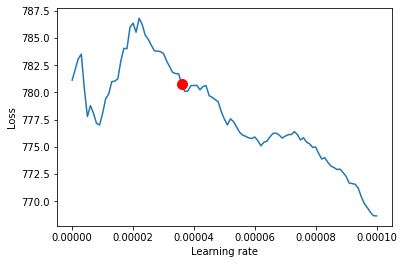

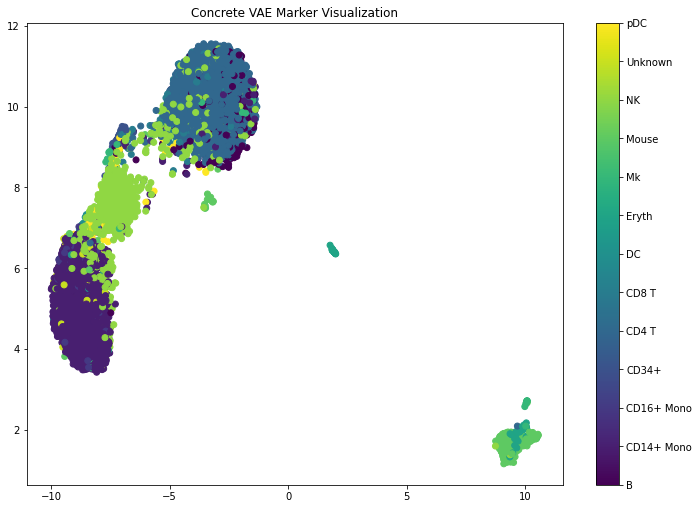

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
Using native 16bit precision.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



--------------------------------------------------------------------------------
DATALOADER:0 VALIDATE RESULTS
{}
--------------------------------------------------------------------------------


Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 11.8 K
1 | enc_mean   | Linear     | 1.0 K 
2 | enc_logvar | Linear     | 1.0 K 
3 | decoder    | Sequential | 33.7 K
4 | dec_logvar | Sequential | 33.7 K
------------------------------------------
106 K     Trainable params
0         Non-trainable params
106 K     Total params
0.425     Total estimated model params size (MB)


New Learning Rate 1.10089e-05


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


Trainer was signaled to stop but required minimum epochs (25) or minimum steps (None) has not been met. Training will continue...


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



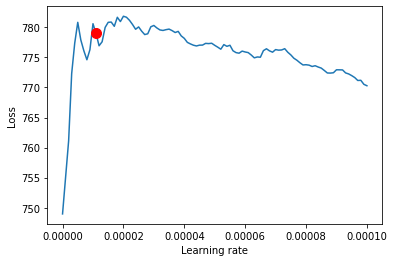

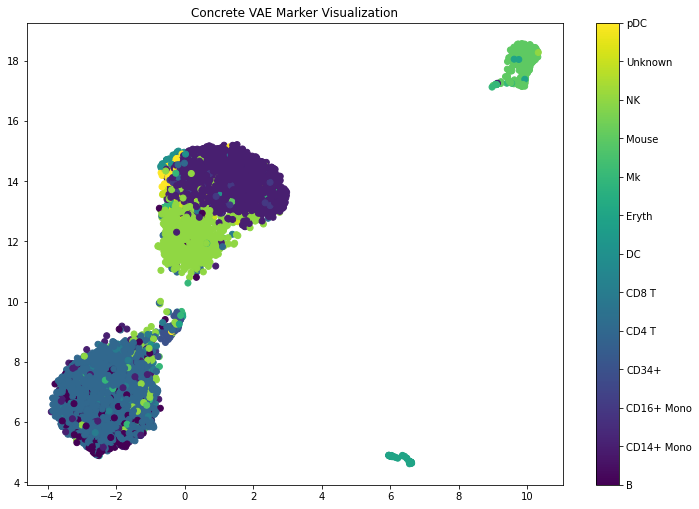

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1, num_workers = num_cores, batch_size = batch_size)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = ConcreteVAE_NMSL(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay = 0.9, batch_norm = batch_norm)
    tmp_path = model_save_path + 'concrete_vae_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 100, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 3, 
                     lr_explore_mode = 'linear', num_lr_rates = 500, precision = 16)
    concrete_vae_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = concrete_vae_markers)
    np.save(model_save_path + 'concrete_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'concrete_vae_markers_{}.npy'.format(tryy), concrete_vae_markers)
    np.save(model_save_path + 'experiment_data_folds/concrete_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Concrete VAE Marker Visualization', path = viz_save_path + 'concrete_vae_markers_{}.png'.format(tryy), markers = concrete_vae_markers)

In [ ]:
results = np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)

In [ ]:
results

array([0.08236658932714613,
       {'0': {'precision': 0.9069767441860465, 'recall': 0.9629629629629629, 'f1-score': 0.934131736526946, 'support': 81}, '1': {'precision': 0.8982035928143712, 'recall': 0.9933774834437086, 'f1-score': 0.9433962264150942, 'support': 453}, '2': {'precision': 1.0, 'recall': 0.6739130434782609, 'f1-score': 0.8051948051948052, 'support': 46}, '3': {'precision': 0.9655172413793104, 'recall': 0.9333333333333333, 'f1-score': 0.9491525423728815, 'support': 30}, '4': {'precision': 0.9052924791086351, 'recall': 0.9938837920489296, 'f1-score': 0.9475218658892128, 'support': 654}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 57}, '6': {'precision': 1.0, 'recall': 0.7058823529411765, 'f1-score': 0.8275862068965517, 'support': 17}, '7': {'precision': 1.0, 'recall': 0.7222222222222222, 'f1-score': 0.8387096774193548, 'support': 18}, '8': {'precision': 0.5, 'recall': 0.07692307692307693, 'f1-score': 0.13333333333333336, 'support': 13}, '9': {'precis

# Results and Visualizations

## Accuracies and F1

In [ ]:
result_axis = [
 ('L1 VAE', 'l1_vae_results_{}.npy'),
 ('Smash RF', 'smash_rf_results_{}.npy'),
 ('SMaSH DNN', 'smash_results_{}.npy'),
 ('RankCorr', 'rankcorr_results_{}.npy'),
 ('Global Gate VAE', 'globalgate_vae_results_{}.npy'),
 ('RunningGumbel VAE', 'runningstate_vae_results_{}.npy'),
 ('RunningGumbel Classifier', 'runningstate_classifier_results_{}.npy'),
 ('Concrete VAE',  'concrete_vae_results_{}.npy')
]

In [ ]:
data_proto = []
indices = []
for axis in result_axis: 
    data_proto.append(model_variances(model_save_path + axis[1], num_times))
    indices.append(axis[0])

In [ ]:
pd.DataFrame(data_proto, index = indices, 
             columns = ['Misclassification Mean', 'Weighted F1 Mean', 'Misclassification Standard Deviation', 'Weighted F1 Standard Deviation'])

,Misclassification Mean,Weighted F1 Mean,Misclassification Standard Deviation,Weighted F1 Standard Deviation
L1 VAE,0.122854,0.844842,0.016404,0.020716
Smash RF,0.068561,0.915151,0.002088,0.003580
SMaSH DNN,0.067053,0.917462,0.003606,0.005150
RankCorr,0.068677,0.911849,0.004045,0.005910
Global Gate VAE,0.125986,0.837386,0.023414,0.031153
RunningGumbel VAE,0.092923,0.881889,0.009240,0.012684
RunningGumbel Classifier,0.062877,0.923783,0.004062,0.005541
Concrete VAE,0.124478,0.838116,0.023125,0.031114


## Confusion Matrices

k = 50

In [ ]:
# https://www.kaggle.com/grfiv4/plot-a-confusion-matrix
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          save_path = None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()


k = 50

### Smash RF

In [ ]:
results =  np.load(model_save_path + 'smash_rf_results_{}.npy'.format(1), allow_pickle = True)

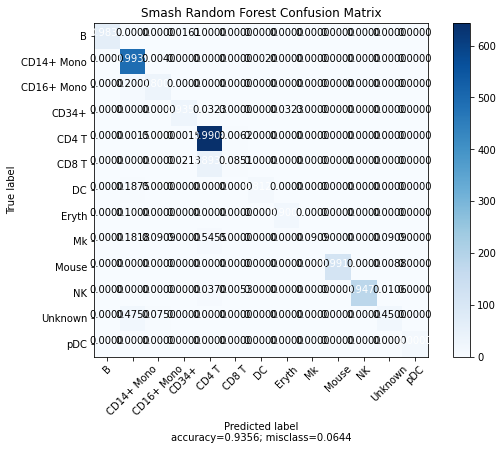

In [ ]:
plot_confusion_matrix(results[2], encoder.classes_, title = 'Smash Random Forest Confusion Matrix', save_path = viz_save_path + 'smash_rf_cm.png')

### RankCorr

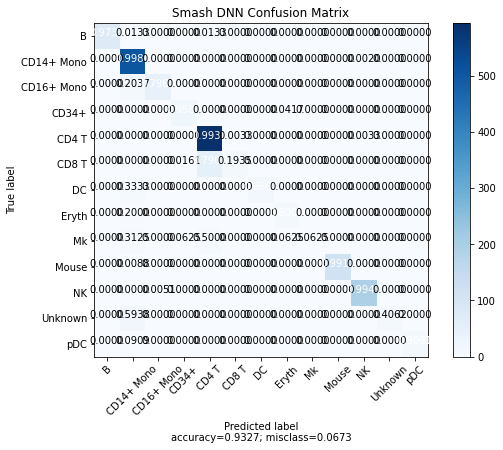

In [ ]:
results =  np.load(model_save_path + 'smash_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Smash DNN Confusion Matrix', save_path = viz_save_path + 'smash_dnn_cm.png')

### L1 VAE

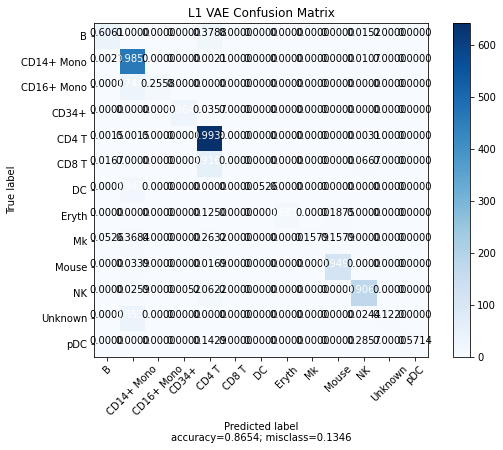

In [ ]:
results =  np.load(model_save_path + 'l1_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'L1 VAE Confusion Matrix', save_path = viz_save_path + 'l1_vae_cm.png')

### Global Gate VAE

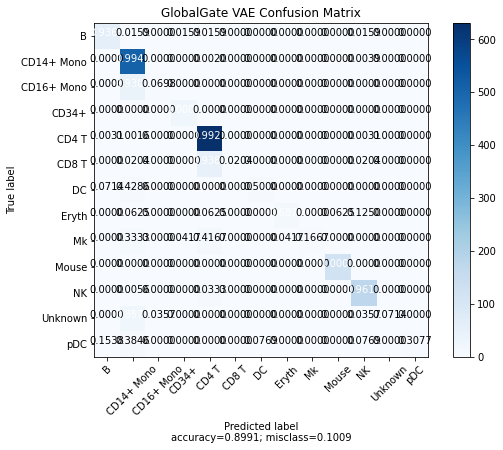

In [ ]:
results =  np.load(model_save_path + 'globalgate_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'GlobalGate VAE Confusion Matrix', save_path = viz_save_path + 'globalgate_vae_cm.png')

### Running Gumbel VAE

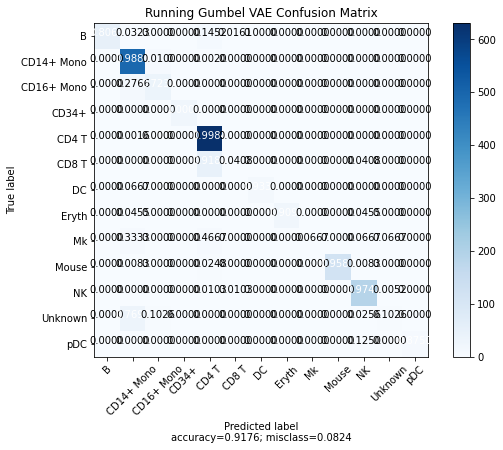

In [ ]:
results =  np.load(model_save_path + 'runningstate_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Running Gumbel VAE Confusion Matrix', save_path = viz_save_path + 'runningstate_vae_cm.png')

### Running Gumbel Classifier


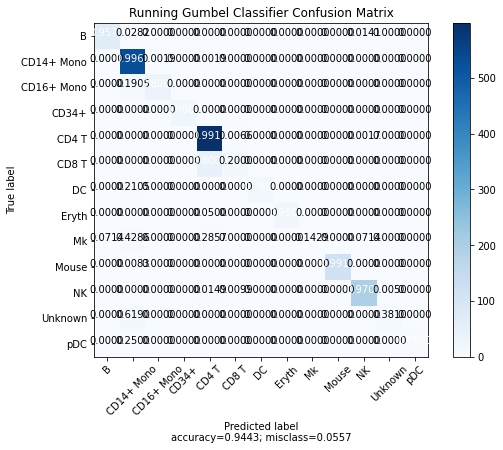

In [ ]:
results =  np.load(model_save_path + 'runningstate_classifier_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Running Gumbel Classifier Confusion Matrix', save_path = viz_save_path + 'runningstate_classifier_cm.png')

### Concrete VAE

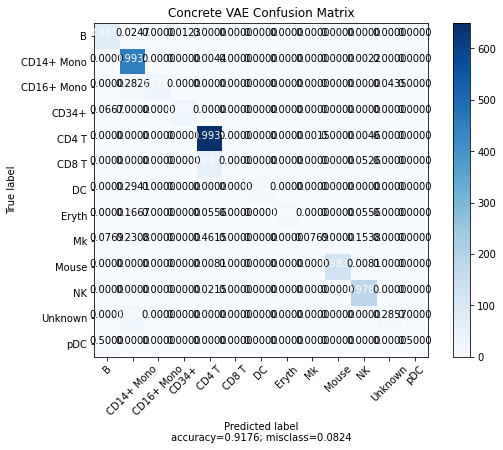

In [ ]:
results =  np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)
plot_confusion_matrix(results[2], encoder.classes_, title = 'Concrete VAE Confusion Matrix', save_path = viz_save_path + 'concrete_vae_cm.png')

## UMap Visualization

In [ ]:
import cv2

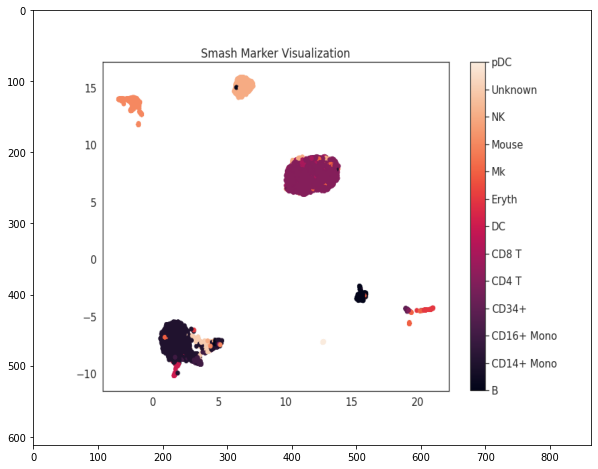

In [ ]:
img = cv2.imread(viz_save_path + 'smash_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

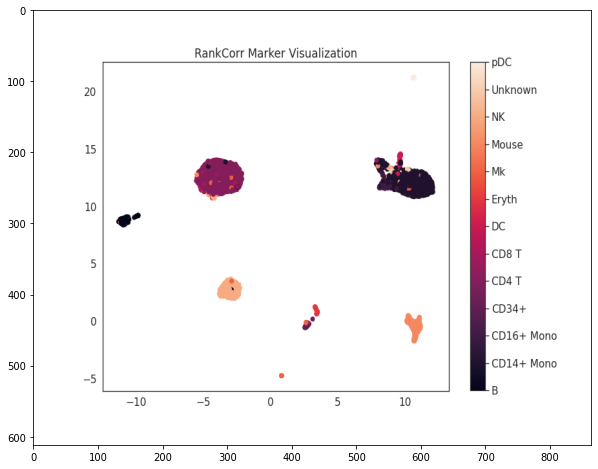

In [ ]:
img = cv2.imread(viz_save_path + 'rankcorr_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')

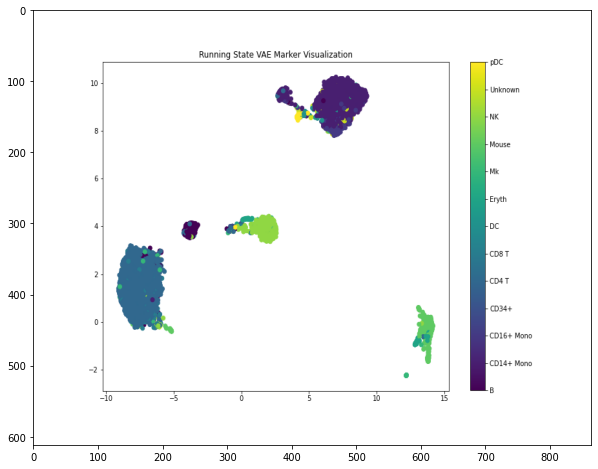

In [ ]:
img = cv2.imread(viz_save_path + 'runningstate_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

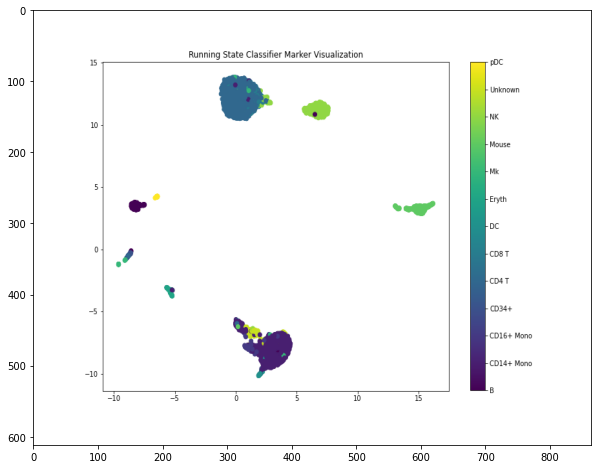

In [ ]:
img = cv2.imread(viz_save_path + 'runningstate_classifier_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

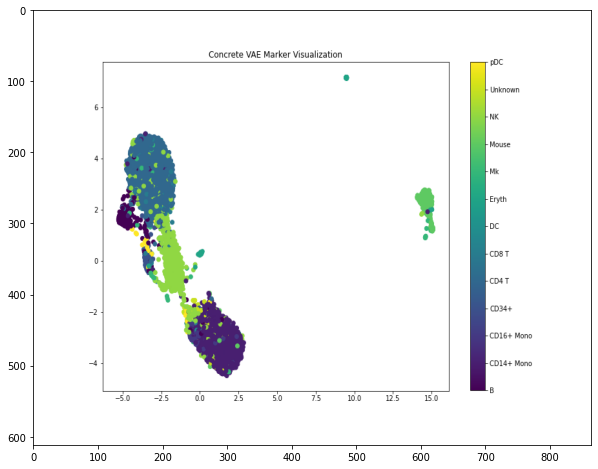

In [ ]:
img = cv2.imread(viz_save_path + 'concrete_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

## Visualizing Reconstructions

from first model of each

## L1 VAE

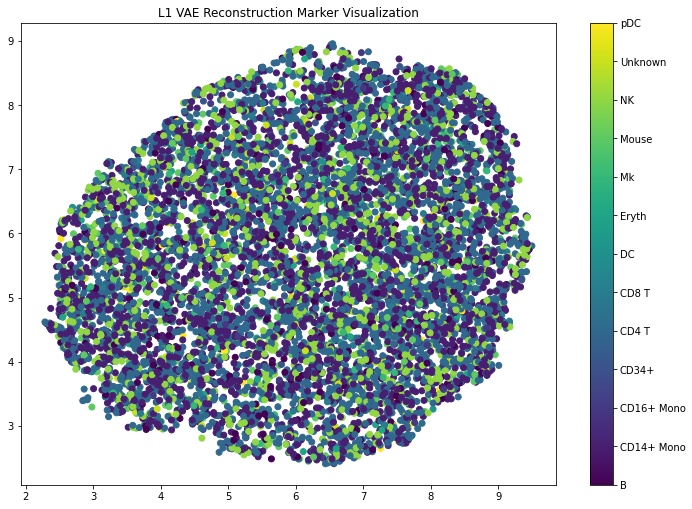

In [ ]:
model = load_model(VAE_l1_diag, model_save_path + 'l1_vae_{}.ckpt'.format(1))
l1_vae_markers = np.load(model_save_path + 'l1_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'L1 VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_l1_vae_{}.png'.format(1), markers = l1_vae_markers)

### Global Gate VAE

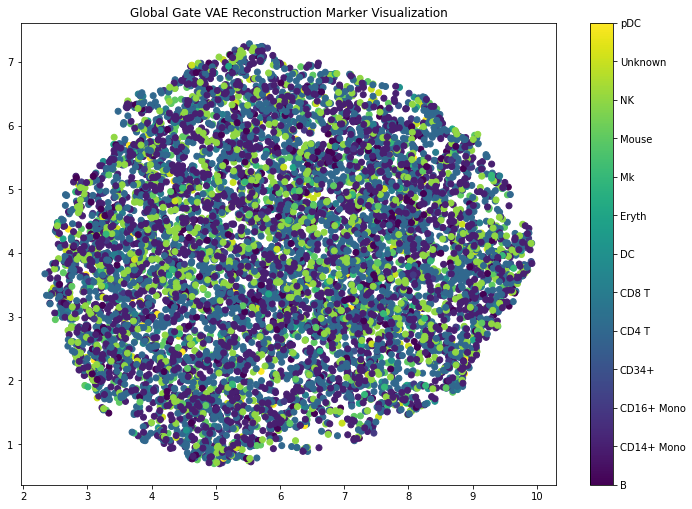

In [ ]:
model = load_model(VAE_Gumbel_GlobalGate, model_save_path + 'globalgate_vae_{}.ckpt'.format(1))
globalgate_vae_markers = np.load(model_save_path + 'globalgate_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Global Gate VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_globalgate_vae_{}.png'.format(1), markers = globalgate_vae_markers)

### Running State Gumbel VAE

In [ ]:
model = load_model(VAE_Gumbel_RunningState, model_save_path + 'runningstate_vae_{}.ckpt'.format(1))


In [ ]:
runningstate_vae_markers = np.load(model_save_path + 'runningstate_vae_markers_{}.npy'.format(1), allow_pickle=True)

In [ ]:
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]

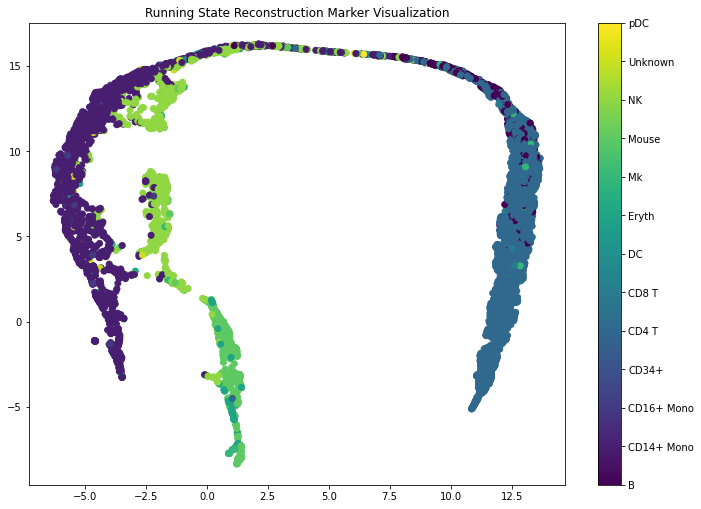

In [ ]:
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Running State Reconstruction Marker Visualization', path = viz_save_path + 'recon_runningstate_vae_{}.png'.format(1), markers = runningstate_vae_markers)

Concrete VAE

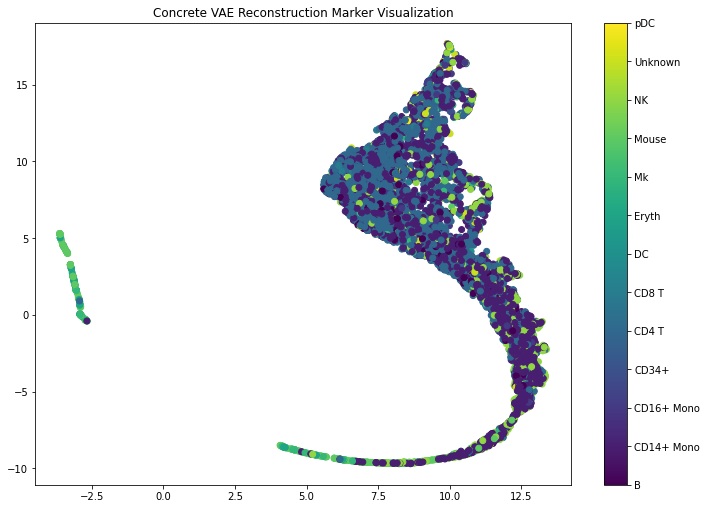

In [ ]:
model = load_model(ConcreteVAE_NMSL, model_save_path + 'concrete_vae_{}.ckpt'.format(1))
concrete_vae_markers = np.load(model_save_path + 'concrete_vae_markers_{}.npy'.format(1), allow_pickle=True)
with torch.no_grad():
    recon_X = model(torch.tensor(X))[0]
visualize_save_embedding(recon_X.cpu(), y, encoder, 'Concrete VAE Reconstruction Marker Visualization', path = viz_save_path + 'recon_concrete_vae_{}.png'.format(1), markers = concrete_vae_markers)

# Things to note for paper

PySmash uses a seed internally so the model is deterministic to a particular dataset. We used various different train seeds, whereas the smash paper uses the whole dataset for the data.

For smash DNN, to select the markers, I had to use all the data. Couldn't just use train and val set.